## LIBRARY

In [2]:
import os
import re
import pandas as pd
import tkinter as tk
from tkinter import ttk
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg
import matplotlib.pyplot as plt
import networkx as nx
from collections import defaultdict
import math
from collections import Counter
import mplcursors
import matplotlib as mpl
import textwrap

## READING FHIR

In [3]:

directory = 'C:/Users/begon/synthea/output/deneme1'

pattern = re.compile(r'(\"resourceType\": \"(Patient|Encounter|Condition|Observation|Procedure|Medication)\")')

classes = ['Patient', 'Encounter', 'Condition', 'Observation', 'Procedure', 'Medication']

current_resource_type = None
new_resource_type = None
resource_type = None
current_id = None
new_id = None
current_references = []
current_codes = []
display = []
current_patient_id = None
previous_display = None 
previous_code = None 
code_starts_with_LA = False  # Flag to track if the current code starts with "LA"


data = {'ResourceType': [], 'ID': [], 'References': [], 'Codes': [], 'PatientID': []}

counts = {resource_type: 1 for resource_type in classes}

INIT = False

for filename in os.listdir(directory):
    if filename.endswith('.json'):
        with open(os.path.join(directory, filename), 'r', encoding='utf-8') as f:
            for line in f:
                match = pattern.search(line)
                if '"resourceType": "' in line and not match:
                    resource_type = line.split('"')[3]
                    INIT = False
                if match:
                    if match.group(2) in classes:
                        new_resource_type = match.group(2)
                        INIT = True
                        next_line = next(f, None)
                        if next_line and '"id": "' in next_line:
                            new_id = next_line.split('"id": "')[1].split('"')[0]
                if current_resource_type == new_resource_type and '"reference": "urn:uuid:' in line and INIT:
                    reference = line.split(':')[3].split('"')[0]
                    current_references.append(reference)    
                    
                if current_resource_type == new_resource_type and '"code": "' in line and INIT:
                    code = line.split('"code": "')[1].split('"')[0]
                    if any(char.isdigit() for char in code):
                        print(current_patient_id, code)
                        next_line = next(f, None)
                        if next_line and '"display": "' in next_line:
                            if code.startswith("LA") and previous_display is not None:                    
                                display = previous_display + ': ' + next_line.split('"display": "')[1].split('"')[0]
                                code = previous_code
                                current_codes[-1] = (previous_code, display)
                                #current_codes.append((previous_code, display))
                                print('(code, display)', (current_patient_id, code, display))
                                code_starts_with_LA = True
                            else:
                                display = next_line.split('"display": "')[1].split('"')[0]
                                current_codes.append((code, display))
                                code_starts_with_LA = False
                                #print('(code, display)', (current_patient_id, code, display))
                        # Update previous display only if the code doesn't start with "LA"
                        if not code_starts_with_LA:
                            previous_display = display
                            previous_code = code

                 
                if current_resource_type != new_resource_type  and INIT:
                    if current_resource_type and current_id:
                        data['ResourceType'].append(current_resource_type)
                        data['ID'].append(current_id)
                        if current_resource_type == 'Patient':
                            current_patient_id = current_id
                        data['References'].append(tuple(current_references))
                        data['Codes'].append(tuple(current_codes))
                        data['PatientID'].append(current_patient_id)
                        current_references = []
                        current_codes = []
                    current_resource_type = new_resource_type    
                    current_id = new_id

df = pd.DataFrame(data)
grouped = df.groupby('PatientID')
aggregated_data = grouped.sum()
aggregated_data.to_csv('C:/Users/begon/Desktop/LMI PROJECT/GIT-LMI/Patient1.csv')


None 2106-3
None 2186-5
51756d22-cce1-b26f-aec8-de4ea95f7337 410620009
51756d22-cce1-b26f-aec8-de4ea95f7337 314529007
51756d22-cce1-b26f-aec8-de4ea95f7337 410620009
51756d22-cce1-b26f-aec8-de4ea95f7337 8302-2
51756d22-cce1-b26f-aec8-de4ea95f7337 72514-3
51756d22-cce1-b26f-aec8-de4ea95f7337 29463-7
51756d22-cce1-b26f-aec8-de4ea95f7337 39156-5
51756d22-cce1-b26f-aec8-de4ea95f7337 kg/m2
51756d22-cce1-b26f-aec8-de4ea95f7337 59576-9
51756d22-cce1-b26f-aec8-de4ea95f7337 85354-9
51756d22-cce1-b26f-aec8-de4ea95f7337 8462-4
51756d22-cce1-b26f-aec8-de4ea95f7337 8480-6
51756d22-cce1-b26f-aec8-de4ea95f7337 8867-4
51756d22-cce1-b26f-aec8-de4ea95f7337 9279-1
51756d22-cce1-b26f-aec8-de4ea95f7337 6690-2
51756d22-cce1-b26f-aec8-de4ea95f7337 10*3/uL
51756d22-cce1-b26f-aec8-de4ea95f7337 789-8
51756d22-cce1-b26f-aec8-de4ea95f7337 10*6/uL
51756d22-cce1-b26f-aec8-de4ea95f7337 718-7
51756d22-cce1-b26f-aec8-de4ea95f7337 4544-3
51756d22-cce1-b26f-aec8-de4ea95f7337 787-2
51756d22-cce1-b26f-aec8-de4ea95f7337 785

e350e277-a061-8175-a841-2b2df12a6077 2106-3
e350e277-a061-8175-a841-2b2df12a6077 2186-5
df9b7665-e98f-14f5-7ba9-52b1e188843d 185349003
df9b7665-e98f-14f5-7ba9-52b1e188843d 224299000
df9b7665-e98f-14f5-7ba9-52b1e188843d 185349003
df9b7665-e98f-14f5-7ba9-52b1e188843d 314529007
df9b7665-e98f-14f5-7ba9-52b1e188843d 160903007
df9b7665-e98f-14f5-7ba9-52b1e188843d 424441002
df9b7665-e98f-14f5-7ba9-52b1e188843d 72892002
df9b7665-e98f-14f5-7ba9-52b1e188843d 72892002
df9b7665-e98f-14f5-7ba9-52b1e188843d 424619006
df9b7665-e98f-14f5-7ba9-52b1e188843d 72892002
df9b7665-e98f-14f5-7ba9-52b1e188843d 271442007
df9b7665-e98f-14f5-7ba9-52b1e188843d 275833003
df9b7665-e98f-14f5-7ba9-52b1e188843d 274804006
df9b7665-e98f-14f5-7ba9-52b1e188843d 225158009
df9b7665-e98f-14f5-7ba9-52b1e188843d 424619006
df9b7665-e98f-14f5-7ba9-52b1e188843d 72892002
df9b7665-e98f-14f5-7ba9-52b1e188843d 274804006
df9b7665-e98f-14f5-7ba9-52b1e188843d 225158009
df9b7665-e98f-14f5-7ba9-52b1e188843d 185345009
df9b7665-e98f-14f5-7ba9

87be08d6-6189-78b1-bd4e-260d482fd80c 185347001
87be08d6-6189-78b1-bd4e-260d482fd80c 424132000
87be08d6-6189-78b1-bd4e-260d482fd80c 2339-0
87be08d6-6189-78b1-bd4e-260d482fd80c 6299-2
87be08d6-6189-78b1-bd4e-260d482fd80c 38483-4
87be08d6-6189-78b1-bd4e-260d482fd80c 49765-1
87be08d6-6189-78b1-bd4e-260d482fd80c 2947-0
87be08d6-6189-78b1-bd4e-260d482fd80c 6298-4
87be08d6-6189-78b1-bd4e-260d482fd80c 2069-3
87be08d6-6189-78b1-bd4e-260d482fd80c 20565-8
87be08d6-6189-78b1-bd4e-260d482fd80c 33914-3
87be08d6-6189-78b1-bd4e-260d482fd80c 2885-2
87be08d6-6189-78b1-bd4e-260d482fd80c 1751-7
87be08d6-6189-78b1-bd4e-260d482fd80c 10834-0
87be08d6-6189-78b1-bd4e-260d482fd80c 1975-2
87be08d6-6189-78b1-bd4e-260d482fd80c 6768-6
87be08d6-6189-78b1-bd4e-260d482fd80c 1742-6
87be08d6-6189-78b1-bd4e-260d482fd80c 1920-8
87be08d6-6189-78b1-bd4e-260d482fd80c 5767-9
87be08d6-6189-78b1-bd4e-260d482fd80c 7766007
87be08d6-6189-78b1-bd4e-260d482fd80c 34533-0
87be08d6-6189-78b1-bd4e-260d482fd80c 167248002
87be08d6-6189-78

69c4e57e-1ad8-c28e-02b8-9efcc4a966c3 185345009
69c4e57e-1ad8-c28e-02b8-9efcc4a966c3 444814009
69c4e57e-1ad8-c28e-02b8-9efcc4a966c3 444814009
69c4e57e-1ad8-c28e-02b8-9efcc4a966c3 162673000
69c4e57e-1ad8-c28e-02b8-9efcc4a966c3 8302-2
69c4e57e-1ad8-c28e-02b8-9efcc4a966c3 72514-3
69c4e57e-1ad8-c28e-02b8-9efcc4a966c3 29463-7
69c4e57e-1ad8-c28e-02b8-9efcc4a966c3 39156-5
69c4e57e-1ad8-c28e-02b8-9efcc4a966c3 kg/m2
69c4e57e-1ad8-c28e-02b8-9efcc4a966c3 85354-9
69c4e57e-1ad8-c28e-02b8-9efcc4a966c3 8462-4
69c4e57e-1ad8-c28e-02b8-9efcc4a966c3 8480-6
69c4e57e-1ad8-c28e-02b8-9efcc4a966c3 8867-4
69c4e57e-1ad8-c28e-02b8-9efcc4a966c3 9279-1
69c4e57e-1ad8-c28e-02b8-9efcc4a966c3 2093-3
69c4e57e-1ad8-c28e-02b8-9efcc4a966c3 2571-8
69c4e57e-1ad8-c28e-02b8-9efcc4a966c3 18262-6
69c4e57e-1ad8-c28e-02b8-9efcc4a966c3 2085-9
69c4e57e-1ad8-c28e-02b8-9efcc4a966c3 6690-2
69c4e57e-1ad8-c28e-02b8-9efcc4a966c3 10*3/uL
69c4e57e-1ad8-c28e-02b8-9efcc4a966c3 789-8
69c4e57e-1ad8-c28e-02b8-9efcc4a966c3 10*6/uL
69c4e57e-1ad8-c

0840b06d-4426-eb63-3c01-af9bcd018556 5797-6
0840b06d-4426-eb63-3c01-af9bcd018556 2514-8
0840b06d-4426-eb63-3c01-af9bcd018556 167290008
0840b06d-4426-eb63-3c01-af9bcd018556 5811-5
0840b06d-4426-eb63-3c01-af9bcd018556 5803-2
0840b06d-4426-eb63-3c01-af9bcd018556 5804-0
0840b06d-4426-eb63-3c01-af9bcd018556 20454-5
0840b06d-4426-eb63-3c01-af9bcd018556 167276005
0840b06d-4426-eb63-3c01-af9bcd018556 5802-4
0840b06d-4426-eb63-3c01-af9bcd018556 314138001
0840b06d-4426-eb63-3c01-af9bcd018556 5794-3
0840b06d-4426-eb63-3c01-af9bcd018556 167297006
0840b06d-4426-eb63-3c01-af9bcd018556 5799-2
0840b06d-4426-eb63-3c01-af9bcd018556 394717006
0840b06d-4426-eb63-3c01-af9bcd018556 8302-2
0840b06d-4426-eb63-3c01-af9bcd018556 72514-3
0840b06d-4426-eb63-3c01-af9bcd018556 29463-7
0840b06d-4426-eb63-3c01-af9bcd018556 39156-5
0840b06d-4426-eb63-3c01-af9bcd018556 kg/m2
0840b06d-4426-eb63-3c01-af9bcd018556 85354-9
0840b06d-4426-eb63-3c01-af9bcd018556 8462-4
0840b06d-4426-eb63-3c01-af9bcd018556 8480-6
0840b06d-4426

0840b06d-4426-eb63-3c01-af9bcd018556 702927004
0840b06d-4426-eb63-3c01-af9bcd018556 2345-7
0840b06d-4426-eb63-3c01-af9bcd018556 3094-0
0840b06d-4426-eb63-3c01-af9bcd018556 2160-0
0840b06d-4426-eb63-3c01-af9bcd018556 17861-6
0840b06d-4426-eb63-3c01-af9bcd018556 2951-2
0840b06d-4426-eb63-3c01-af9bcd018556 2823-3
0840b06d-4426-eb63-3c01-af9bcd018556 2075-0
0840b06d-4426-eb63-3c01-af9bcd018556 2028-9
0840b06d-4426-eb63-3c01-af9bcd018556 33914-3
0840b06d-4426-eb63-3c01-af9bcd018556 mL/min/{1.73_m2}
0840b06d-4426-eb63-3c01-af9bcd018556 5767-9
0840b06d-4426-eb63-3c01-af9bcd018556 7766007
0840b06d-4426-eb63-3c01-af9bcd018556 34533-0
0840b06d-4426-eb63-3c01-af9bcd018556 167248002
0840b06d-4426-eb63-3c01-af9bcd018556 32167-9
0840b06d-4426-eb63-3c01-af9bcd018556 300828005
0840b06d-4426-eb63-3c01-af9bcd018556 5778-6
0840b06d-4426-eb63-3c01-af9bcd018556 371254008
0840b06d-4426-eb63-3c01-af9bcd018556 5792-7
0840b06d-4426-eb63-3c01-af9bcd018556 25428-4
0840b06d-4426-eb63-3c01-af9bcd018556 167265006
0

0840b06d-4426-eb63-3c01-af9bcd018556 162673000
0840b06d-4426-eb63-3c01-af9bcd018556 314529007
0840b06d-4426-eb63-3c01-af9bcd018556 2345-7
0840b06d-4426-eb63-3c01-af9bcd018556 3094-0
0840b06d-4426-eb63-3c01-af9bcd018556 2160-0
0840b06d-4426-eb63-3c01-af9bcd018556 17861-6
0840b06d-4426-eb63-3c01-af9bcd018556 2951-2
0840b06d-4426-eb63-3c01-af9bcd018556 2823-3
0840b06d-4426-eb63-3c01-af9bcd018556 2075-0
0840b06d-4426-eb63-3c01-af9bcd018556 2028-9
0840b06d-4426-eb63-3c01-af9bcd018556 33914-3
0840b06d-4426-eb63-3c01-af9bcd018556 mL/min/{1.73_m2}
0840b06d-4426-eb63-3c01-af9bcd018556 5767-9
0840b06d-4426-eb63-3c01-af9bcd018556 7766007
0840b06d-4426-eb63-3c01-af9bcd018556 34533-0
0840b06d-4426-eb63-3c01-af9bcd018556 167248002
0840b06d-4426-eb63-3c01-af9bcd018556 32167-9
0840b06d-4426-eb63-3c01-af9bcd018556 300828005
0840b06d-4426-eb63-3c01-af9bcd018556 5778-6
0840b06d-4426-eb63-3c01-af9bcd018556 371254008
0840b06d-4426-eb63-3c01-af9bcd018556 5792-7
0840b06d-4426-eb63-3c01-af9bcd018556 25428-4
0

2e1581ff-ec8e-74f9-b253-7fe2d4a4a105 38483-4
2e1581ff-ec8e-74f9-b253-7fe2d4a4a105 49765-1
2e1581ff-ec8e-74f9-b253-7fe2d4a4a105 2947-0
2e1581ff-ec8e-74f9-b253-7fe2d4a4a105 6298-4
2e1581ff-ec8e-74f9-b253-7fe2d4a4a105 2069-3
2e1581ff-ec8e-74f9-b253-7fe2d4a4a105 20565-8
2e1581ff-ec8e-74f9-b253-7fe2d4a4a105 33914-3
2e1581ff-ec8e-74f9-b253-7fe2d4a4a105 2885-2
2e1581ff-ec8e-74f9-b253-7fe2d4a4a105 1751-7
2e1581ff-ec8e-74f9-b253-7fe2d4a4a105 10834-0
2e1581ff-ec8e-74f9-b253-7fe2d4a4a105 1975-2
2e1581ff-ec8e-74f9-b253-7fe2d4a4a105 6768-6
2e1581ff-ec8e-74f9-b253-7fe2d4a4a105 1742-6
2e1581ff-ec8e-74f9-b253-7fe2d4a4a105 1920-8
2e1581ff-ec8e-74f9-b253-7fe2d4a4a105 2093-3
2e1581ff-ec8e-74f9-b253-7fe2d4a4a105 2571-8
2e1581ff-ec8e-74f9-b253-7fe2d4a4a105 18262-6
2e1581ff-ec8e-74f9-b253-7fe2d4a4a105 2085-9
2e1581ff-ec8e-74f9-b253-7fe2d4a4a105 162673000
2e1581ff-ec8e-74f9-b253-7fe2d4a4a105 424393004
2e1581ff-ec8e-74f9-b253-7fe2d4a4a105 2345-7
2e1581ff-ec8e-74f9-b253-7fe2d4a4a105 3094-0
2e1581ff-ec8e-74f9-b

a531a5e4-df59-85b8-7c34-4bb4b6e6c4e9 2106-3
a531a5e4-df59-85b8-7c34-4bb4b6e6c4e9 2186-5
12e9b2d9-98d8-5147-12f7-6ac08fee3402 410620009
12e9b2d9-98d8-5147-12f7-6ac08fee3402 314529007
12e9b2d9-98d8-5147-12f7-6ac08fee3402 162673000
12e9b2d9-98d8-5147-12f7-6ac08fee3402 224299000
12e9b2d9-98d8-5147-12f7-6ac08fee3402 162673000
12e9b2d9-98d8-5147-12f7-6ac08fee3402 160903007
12e9b2d9-98d8-5147-12f7-6ac08fee3402 423315002
12e9b2d9-98d8-5147-12f7-6ac08fee3402 73595000
12e9b2d9-98d8-5147-12f7-6ac08fee3402 162673000
12e9b2d9-98d8-5147-12f7-6ac08fee3402 8302-2
12e9b2d9-98d8-5147-12f7-6ac08fee3402 72514-3
12e9b2d9-98d8-5147-12f7-6ac08fee3402 29463-7
12e9b2d9-98d8-5147-12f7-6ac08fee3402 39156-5
12e9b2d9-98d8-5147-12f7-6ac08fee3402 kg/m2
12e9b2d9-98d8-5147-12f7-6ac08fee3402 85354-9
12e9b2d9-98d8-5147-12f7-6ac08fee3402 8462-4
12e9b2d9-98d8-5147-12f7-6ac08fee3402 8480-6
12e9b2d9-98d8-5147-12f7-6ac08fee3402 8867-4
12e9b2d9-98d8-5147-12f7-6ac08fee3402 9279-1
12e9b2d9-98d8-5147-12f7-6ac08fee3402 6690-2
12e

7a12ead8-70a2-444f-d1f3-4a6221d82bb5 698314001
7a12ead8-70a2-444f-d1f3-4a6221d82bb5 389095005
7a12ead8-70a2-444f-d1f3-4a6221d82bb5 308335008
7a12ead8-70a2-444f-d1f3-4a6221d82bb5 389095005
7a12ead8-70a2-444f-d1f3-4a6221d82bb5 301807007
7a12ead8-70a2-444f-d1f3-4a6221d82bb5 169553002
7a12ead8-70a2-444f-d1f3-4a6221d82bb5 33879002
7a12ead8-70a2-444f-d1f3-4a6221d82bb5 33879002
7a12ead8-70a2-444f-d1f3-4a6221d82bb5 698314001
7a12ead8-70a2-444f-d1f3-4a6221d82bb5 389095005
7a12ead8-70a2-444f-d1f3-4a6221d82bb5 308335008
7a12ead8-70a2-444f-d1f3-4a6221d82bb5 389095005
7a12ead8-70a2-444f-d1f3-4a6221d82bb5 301807007
7a12ead8-70a2-444f-d1f3-4a6221d82bb5 185345009
7a12ead8-70a2-444f-d1f3-4a6221d82bb5 75498004
7a12ead8-70a2-444f-d1f3-4a6221d82bb5 75498004
7a12ead8-70a2-444f-d1f3-4a6221d82bb5 702927004
7a12ead8-70a2-444f-d1f3-4a6221d82bb5 314529007
7a12ead8-70a2-444f-d1f3-4a6221d82bb5 8302-2
7a12ead8-70a2-444f-d1f3-4a6221d82bb5 72514-3
7a12ead8-70a2-444f-d1f3-4a6221d82bb5 29463-7
7a12ead8-70a2-444f-d1f3-

453626cc-8858-c7ff-f659-0efed8b570f3 162673000
453626cc-8858-c7ff-f659-0efed8b570f3 73438004
453626cc-8858-c7ff-f659-0efed8b570f3 423315002
453626cc-8858-c7ff-f659-0efed8b570f3 8302-2
453626cc-8858-c7ff-f659-0efed8b570f3 72514-3
453626cc-8858-c7ff-f659-0efed8b570f3 29463-7
453626cc-8858-c7ff-f659-0efed8b570f3 39156-5
453626cc-8858-c7ff-f659-0efed8b570f3 kg/m2
453626cc-8858-c7ff-f659-0efed8b570f3 85354-9
453626cc-8858-c7ff-f659-0efed8b570f3 8462-4
453626cc-8858-c7ff-f659-0efed8b570f3 8480-6
453626cc-8858-c7ff-f659-0efed8b570f3 8867-4
453626cc-8858-c7ff-f659-0efed8b570f3 9279-1
453626cc-8858-c7ff-f659-0efed8b570f3 6690-2
453626cc-8858-c7ff-f659-0efed8b570f3 10*3/uL
453626cc-8858-c7ff-f659-0efed8b570f3 789-8
453626cc-8858-c7ff-f659-0efed8b570f3 10*6/uL
453626cc-8858-c7ff-f659-0efed8b570f3 718-7
453626cc-8858-c7ff-f659-0efed8b570f3 4544-3
453626cc-8858-c7ff-f659-0efed8b570f3 787-2
453626cc-8858-c7ff-f659-0efed8b570f3 785-6
453626cc-8858-c7ff-f659-0efed8b570f3 786-4
453626cc-8858-c7ff-f659-

799f7e1a-9c0d-3232-7002-757ff28727ec 785-6
799f7e1a-9c0d-3232-7002-757ff28727ec 786-4
799f7e1a-9c0d-3232-7002-757ff28727ec 21000-5
799f7e1a-9c0d-3232-7002-757ff28727ec 777-3
799f7e1a-9c0d-3232-7002-757ff28727ec 10*3/uL
799f7e1a-9c0d-3232-7002-757ff28727ec 32207-3
799f7e1a-9c0d-3232-7002-757ff28727ec 32623-1
799f7e1a-9c0d-3232-7002-757ff28727ec 72166-2
799f7e1a-9c0d-3232-7002-757ff28727ec 266919005
799f7e1a-9c0d-3232-7002-757ff28727ec 93025-5
799f7e1a-9c0d-3232-7002-757ff28727ec 76501-6
799f7e1a-9c0d-3232-7002-757ff28727ec LA32-8
(code, display) ('799f7e1a-9c0d-3232-7002-757ff28727ec', '76501-6', 'Within the last year, have you been afraid of your partner or ex-partner?: No')
799f7e1a-9c0d-3232-7002-757ff28727ec 93026-3
799f7e1a-9c0d-3232-7002-757ff28727ec LA33-6
(code, display) ('799f7e1a-9c0d-3232-7002-757ff28727ec', '93026-3', 'Do you feel physically and emotionally safe where you currently live?: Yes')
799f7e1a-9c0d-3232-7002-757ff28727ec 93027-1
799f7e1a-9c0d-3232-7002-757ff28727ec

ed7c7100-a48f-147a-c280-4bc2885f14a5 10*6/uL
ed7c7100-a48f-147a-c280-4bc2885f14a5 718-7
ed7c7100-a48f-147a-c280-4bc2885f14a5 4544-3
ed7c7100-a48f-147a-c280-4bc2885f14a5 787-2
ed7c7100-a48f-147a-c280-4bc2885f14a5 785-6
ed7c7100-a48f-147a-c280-4bc2885f14a5 786-4
ed7c7100-a48f-147a-c280-4bc2885f14a5 21000-5
ed7c7100-a48f-147a-c280-4bc2885f14a5 777-3
ed7c7100-a48f-147a-c280-4bc2885f14a5 10*3/uL
ed7c7100-a48f-147a-c280-4bc2885f14a5 32207-3
ed7c7100-a48f-147a-c280-4bc2885f14a5 32623-1
ed7c7100-a48f-147a-c280-4bc2885f14a5 72166-2
ed7c7100-a48f-147a-c280-4bc2885f14a5 266919005
ed7c7100-a48f-147a-c280-4bc2885f14a5 93025-5
ed7c7100-a48f-147a-c280-4bc2885f14a5 76501-6
ed7c7100-a48f-147a-c280-4bc2885f14a5 LA32-8
(code, display) ('ed7c7100-a48f-147a-c280-4bc2885f14a5', '76501-6', 'Within the last year, have you been afraid of your partner or ex-partner?: No')
ed7c7100-a48f-147a-c280-4bc2885f14a5 93026-3
ed7c7100-a48f-147a-c280-4bc2885f14a5 LA33-6
(code, display) ('ed7c7100-a48f-147a-c280-4bc2885f14

063710c2-c58f-a86e-5205-f37316495260 185345009
063710c2-c58f-a86e-5205-f37316495260 195662009
063710c2-c58f-a86e-5205-f37316495260 195662009
063710c2-c58f-a86e-5205-f37316495260 8310-5
063710c2-c58f-a86e-5205-f37316495260 8331-1
063710c2-c58f-a86e-5205-f37316495260 117015009
063710c2-c58f-a86e-5205-f37316495260 162673000
063710c2-c58f-a86e-5205-f37316495260 73438004
063710c2-c58f-a86e-5205-f37316495260 8302-2
063710c2-c58f-a86e-5205-f37316495260 72514-3
063710c2-c58f-a86e-5205-f37316495260 29463-7
063710c2-c58f-a86e-5205-f37316495260 39156-5
063710c2-c58f-a86e-5205-f37316495260 kg/m2
063710c2-c58f-a86e-5205-f37316495260 85354-9
063710c2-c58f-a86e-5205-f37316495260 8462-4
063710c2-c58f-a86e-5205-f37316495260 8480-6
063710c2-c58f-a86e-5205-f37316495260 8867-4
063710c2-c58f-a86e-5205-f37316495260 9279-1
063710c2-c58f-a86e-5205-f37316495260 2093-3
063710c2-c58f-a86e-5205-f37316495260 2571-8
063710c2-c58f-a86e-5205-f37316495260 18262-6
063710c2-c58f-a86e-5205-f37316495260 2085-9
063710c2-c5

d6506274-da2b-512c-ede5-c03d1de416d6 171207006
d6506274-da2b-512c-ede5-c03d1de416d6 454711000124102
d6506274-da2b-512c-ede5-c03d1de416d6 715252007
d6506274-da2b-512c-ede5-c03d1de416d6 390906007
d6506274-da2b-512c-ede5-c03d1de416d6 55822004
d6506274-da2b-512c-ede5-c03d1de416d6 185345009
d6506274-da2b-512c-ede5-c03d1de416d6 444814009
d6506274-da2b-512c-ede5-c03d1de416d6 444814009
d6506274-da2b-512c-ede5-c03d1de416d6 162673000
d6506274-da2b-512c-ede5-c03d1de416d6 314529007
d6506274-da2b-512c-ede5-c03d1de416d6 422650009
d6506274-da2b-512c-ede5-c03d1de416d6 73595000
d6506274-da2b-512c-ede5-c03d1de416d6 424393004
d6506274-da2b-512c-ede5-c03d1de416d6 8302-2
d6506274-da2b-512c-ede5-c03d1de416d6 72514-3
d6506274-da2b-512c-ede5-c03d1de416d6 29463-7
d6506274-da2b-512c-ede5-c03d1de416d6 39156-5
d6506274-da2b-512c-ede5-c03d1de416d6 kg/m2
d6506274-da2b-512c-ede5-c03d1de416d6 85354-9
d6506274-da2b-512c-ede5-c03d1de416d6 8462-4
d6506274-da2b-512c-ede5-c03d1de416d6 8480-6
d6506274-da2b-512c-ede5-c03d1d

193c5f55-1d46-6a98-1adf-8d99d3c497b2 185349003
193c5f55-1d46-6a98-1adf-8d99d3c497b2 314529007
193c5f55-1d46-6a98-1adf-8d99d3c497b2 4548-4
193c5f55-1d46-6a98-1adf-8d99d3c497b2 185345009
193c5f55-1d46-6a98-1adf-8d99d3c497b2 10509002
193c5f55-1d46-6a98-1adf-8d99d3c497b2 10509002
193c5f55-1d46-6a98-1adf-8d99d3c497b2 23426006
193c5f55-1d46-6a98-1adf-8d99d3c497b2 162673000
193c5f55-1d46-6a98-1adf-8d99d3c497b2 160903007
193c5f55-1d46-6a98-1adf-8d99d3c497b2 4548-4
193c5f55-1d46-6a98-1adf-8d99d3c497b2 8302-2
193c5f55-1d46-6a98-1adf-8d99d3c497b2 72514-3
193c5f55-1d46-6a98-1adf-8d99d3c497b2 29463-7
193c5f55-1d46-6a98-1adf-8d99d3c497b2 39156-5
193c5f55-1d46-6a98-1adf-8d99d3c497b2 kg/m2
193c5f55-1d46-6a98-1adf-8d99d3c497b2 85354-9
193c5f55-1d46-6a98-1adf-8d99d3c497b2 8462-4
193c5f55-1d46-6a98-1adf-8d99d3c497b2 8480-6
193c5f55-1d46-6a98-1adf-8d99d3c497b2 8867-4
193c5f55-1d46-6a98-1adf-8d99d3c497b2 9279-1
193c5f55-1d46-6a98-1adf-8d99d3c497b2 2339-0
193c5f55-1d46-6a98-1adf-8d99d3c497b2 6299-2
193c5f55

c9490604-2f27-6c55-8289-5222ef6e59bb 54899-0
c9490604-2f27-6c55-8289-5222ef6e59bb LA43-5
(code, display) ('c9490604-2f27-6c55-8289-5222ef6e59bb', '54899-0', 'Preferred language: English')
c9490604-2f27-6c55-8289-5222ef6e59bb 93034-7
c9490604-2f27-6c55-8289-5222ef6e59bb LA32-8
(code, display) ('c9490604-2f27-6c55-8289-5222ef6e59bb', '93034-7', 'Have you been discharged from the armed forces of the United States?: No')
c9490604-2f27-6c55-8289-5222ef6e59bb 93035-4
c9490604-2f27-6c55-8289-5222ef6e59bb LA32-8
(code, display) ('c9490604-2f27-6c55-8289-5222ef6e59bb', '93035-4', "At any point in the past 2 years, has season or migrant farm work been your or your family's main source of income?: No")
c9490604-2f27-6c55-8289-5222ef6e59bb 32624-9
c9490604-2f27-6c55-8289-5222ef6e59bb LA4457-3
(code, display) ('c9490604-2f27-6c55-8289-5222ef6e59bb', '32624-9', 'Race: White')
c9490604-2f27-6c55-8289-5222ef6e59bb 56051-6
c9490604-2f27-6c55-8289-5222ef6e59bb LA32-8
(code, display) ('c9490604-2f27-6c55

e296ddc4-00d6-fff4-0ae4-789298009fba 424619006
e296ddc4-00d6-fff4-0ae4-789298009fba 72892002
e296ddc4-00d6-fff4-0ae4-789298009fba 118001005
e296ddc4-00d6-fff4-0ae4-789298009fba 274804006
e296ddc4-00d6-fff4-0ae4-789298009fba 225158009
e296ddc4-00d6-fff4-0ae4-789298009fba 424619006
e296ddc4-00d6-fff4-0ae4-789298009fba 72892002
e296ddc4-00d6-fff4-0ae4-789298009fba 274804006
e296ddc4-00d6-fff4-0ae4-789298009fba 225158009
e296ddc4-00d6-fff4-0ae4-789298009fba 183460006
e296ddc4-00d6-fff4-0ae4-789298009fba 72892002
e296ddc4-00d6-fff4-0ae4-789298009fba 66348005
e296ddc4-00d6-fff4-0ae4-789298009fba 169762003
e296ddc4-00d6-fff4-0ae4-789298009fba 5880005
e296ddc4-00d6-fff4-0ae4-789298009fba 171207006
e296ddc4-00d6-fff4-0ae4-789298009fba 698314001
e296ddc4-00d6-fff4-0ae4-789298009fba 389095005
e296ddc4-00d6-fff4-0ae4-789298009fba 271737000
e296ddc4-00d6-fff4-0ae4-789298009fba 185347001
e296ddc4-00d6-fff4-0ae4-789298009fba 271737000
e296ddc4-00d6-fff4-0ae4-789298009fba 718-7
e296ddc4-00d6-fff4-0ae4

fab050ea-7248-7eea-1c79-aca32b77984e 85354-9
fab050ea-7248-7eea-1c79-aca32b77984e 8462-4
fab050ea-7248-7eea-1c79-aca32b77984e 8480-6
fab050ea-7248-7eea-1c79-aca32b77984e 8867-4
fab050ea-7248-7eea-1c79-aca32b77984e 9279-1
fab050ea-7248-7eea-1c79-aca32b77984e 72166-2
fab050ea-7248-7eea-1c79-aca32b77984e 266919005
fab050ea-7248-7eea-1c79-aca32b77984e 430193006
fab050ea-7248-7eea-1c79-aca32b77984e 410620009
fab050ea-7248-7eea-1c79-aca32b77984e 314529007
fab050ea-7248-7eea-1c79-aca32b77984e 8302-2
fab050ea-7248-7eea-1c79-aca32b77984e 72514-3
fab050ea-7248-7eea-1c79-aca32b77984e 29463-7
fab050ea-7248-7eea-1c79-aca32b77984e 77606-2
fab050ea-7248-7eea-1c79-aca32b77984e 8289-1
fab050ea-7248-7eea-1c79-aca32b77984e 9843-4
fab050ea-7248-7eea-1c79-aca32b77984e 39156-5
fab050ea-7248-7eea-1c79-aca32b77984e kg/m2
fab050ea-7248-7eea-1c79-aca32b77984e 59576-9
fab050ea-7248-7eea-1c79-aca32b77984e 85354-9
fab050ea-7248-7eea-1c79-aca32b77984e 8462-4
fab050ea-7248-7eea-1c79-aca32b77984e 8480-6
fab050ea-7248

0fc4fd4b-1e35-456b-4c99-8c6b574a7278 70274-6
0fc4fd4b-1e35-456b-4c99-8c6b574a7278 55758-7
0fc4fd4b-1e35-456b-4c99-8c6b574a7278 430193006
0fc4fd4b-1e35-456b-4c99-8c6b574a7278 710824005
0fc4fd4b-1e35-456b-4c99-8c6b574a7278 710841007
0fc4fd4b-1e35-456b-4c99-8c6b574a7278 171207006
0fc4fd4b-1e35-456b-4c99-8c6b574a7278 454711000124102
0fc4fd4b-1e35-456b-4c99-8c6b574a7278 390906007
0fc4fd4b-1e35-456b-4c99-8c6b574a7278 55822004
0fc4fd4b-1e35-456b-4c99-8c6b574a7278 2339-0
0fc4fd4b-1e35-456b-4c99-8c6b574a7278 6299-2
0fc4fd4b-1e35-456b-4c99-8c6b574a7278 38483-4
0fc4fd4b-1e35-456b-4c99-8c6b574a7278 49765-1
0fc4fd4b-1e35-456b-4c99-8c6b574a7278 2947-0
0fc4fd4b-1e35-456b-4c99-8c6b574a7278 6298-4
0fc4fd4b-1e35-456b-4c99-8c6b574a7278 2069-3
0fc4fd4b-1e35-456b-4c99-8c6b574a7278 20565-8
0fc4fd4b-1e35-456b-4c99-8c6b574a7278 33914-3
0fc4fd4b-1e35-456b-4c99-8c6b574a7278 2885-2
0fc4fd4b-1e35-456b-4c99-8c6b574a7278 1751-7
0fc4fd4b-1e35-456b-4c99-8c6b574a7278 10834-0
0fc4fd4b-1e35-456b-4c99-8c6b574a7278 1975-2

75388727-fc95-77c6-cdfb-a2f4e771fd9e 308335008
75388727-fc95-77c6-cdfb-a2f4e771fd9e 389095005
75388727-fc95-77c6-cdfb-a2f4e771fd9e 76601001
75388727-fc95-77c6-cdfb-a2f4e771fd9e 162673000
75388727-fc95-77c6-cdfb-a2f4e771fd9e 314529007
75388727-fc95-77c6-cdfb-a2f4e771fd9e 2345-7
75388727-fc95-77c6-cdfb-a2f4e771fd9e 3094-0
75388727-fc95-77c6-cdfb-a2f4e771fd9e 2160-0
75388727-fc95-77c6-cdfb-a2f4e771fd9e 17861-6
75388727-fc95-77c6-cdfb-a2f4e771fd9e 2951-2
75388727-fc95-77c6-cdfb-a2f4e771fd9e 2823-3
75388727-fc95-77c6-cdfb-a2f4e771fd9e 2075-0
75388727-fc95-77c6-cdfb-a2f4e771fd9e 2028-9
75388727-fc95-77c6-cdfb-a2f4e771fd9e 33914-3
75388727-fc95-77c6-cdfb-a2f4e771fd9e mL/min/{1.73_m2}
75388727-fc95-77c6-cdfb-a2f4e771fd9e 5767-9
75388727-fc95-77c6-cdfb-a2f4e771fd9e 7766007
75388727-fc95-77c6-cdfb-a2f4e771fd9e 34533-0
75388727-fc95-77c6-cdfb-a2f4e771fd9e 167248002
75388727-fc95-77c6-cdfb-a2f4e771fd9e 32167-9
75388727-fc95-77c6-cdfb-a2f4e771fd9e 300828005
75388727-fc95-77c6-cdfb-a2f4e771fd9e 5778

(code, display) ('993c97ed-deef-5c5d-b32d-7fcaedfcee85', '54899-0', 'Preferred language: Language other than English')
993c97ed-deef-5c5d-b32d-7fcaedfcee85 93034-7
993c97ed-deef-5c5d-b32d-7fcaedfcee85 LA32-8
(code, display) ('993c97ed-deef-5c5d-b32d-7fcaedfcee85', '93034-7', 'Have you been discharged from the armed forces of the United States?: No')
993c97ed-deef-5c5d-b32d-7fcaedfcee85 93035-4
993c97ed-deef-5c5d-b32d-7fcaedfcee85 LA32-8
(code, display) ('993c97ed-deef-5c5d-b32d-7fcaedfcee85', '93035-4', "At any point in the past 2 years, has season or migrant farm work been your or your family's main source of income?: No")
993c97ed-deef-5c5d-b32d-7fcaedfcee85 32624-9
993c97ed-deef-5c5d-b32d-7fcaedfcee85 LA4457-3
(code, display) ('993c97ed-deef-5c5d-b32d-7fcaedfcee85', '32624-9', 'Race: White')
993c97ed-deef-5c5d-b32d-7fcaedfcee85 56051-6
993c97ed-deef-5c5d-b32d-7fcaedfcee85 LA32-8
(code, display) ('993c97ed-deef-5c5d-b32d-7fcaedfcee85', '56051-6', 'Do you consider yourself Hispanic/La

5e6910b6-9764-4860-9b2c-323e2e8db1bd 93034-7
5e6910b6-9764-4860-9b2c-323e2e8db1bd LA32-8
(code, display) ('5e6910b6-9764-4860-9b2c-323e2e8db1bd', '93034-7', 'Have you been discharged from the armed forces of the United States?: No')
5e6910b6-9764-4860-9b2c-323e2e8db1bd 93035-4
5e6910b6-9764-4860-9b2c-323e2e8db1bd LA32-8
(code, display) ('5e6910b6-9764-4860-9b2c-323e2e8db1bd', '93035-4', "At any point in the past 2 years, has season or migrant farm work been your or your family's main source of income?: No")
5e6910b6-9764-4860-9b2c-323e2e8db1bd 32624-9
5e6910b6-9764-4860-9b2c-323e2e8db1bd LA4457-3
(code, display) ('5e6910b6-9764-4860-9b2c-323e2e8db1bd', '32624-9', 'Race: White')
5e6910b6-9764-4860-9b2c-323e2e8db1bd 56051-6
5e6910b6-9764-4860-9b2c-323e2e8db1bd LA32-8
(code, display) ('5e6910b6-9764-4860-9b2c-323e2e8db1bd', '56051-6', 'Do you consider yourself Hispanic/Latino?: No')
5e6910b6-9764-4860-9b2c-323e2e8db1bd 76504-0
5e6910b6-9764-4860-9b2c-323e2e8db1bd 55758-7
5e6910b6-9764-486

bf7176ea-7fe6-165e-a89f-e875db89d6b7 741062008
bf7176ea-7fe6-165e-a89f-e875db89d6b7 422650009
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2345-7
bf7176ea-7fe6-165e-a89f-e875db89d6b7 3094-0
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2160-0
bf7176ea-7fe6-165e-a89f-e875db89d6b7 17861-6
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2951-2
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2823-3
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2075-0
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2028-9
bf7176ea-7fe6-165e-a89f-e875db89d6b7 33914-3
bf7176ea-7fe6-165e-a89f-e875db89d6b7 mL/min/{1.73_m2}
bf7176ea-7fe6-165e-a89f-e875db89d6b7 5767-9
bf7176ea-7fe6-165e-a89f-e875db89d6b7 7766007
bf7176ea-7fe6-165e-a89f-e875db89d6b7 34533-0
bf7176ea-7fe6-165e-a89f-e875db89d6b7 167248002
bf7176ea-7fe6-165e-a89f-e875db89d6b7 32167-9
bf7176ea-7fe6-165e-a89f-e875db89d6b7 300828005
bf7176ea-7fe6-165e-a89f-e875db89d6b7 5778-6
bf7176ea-7fe6-165e-a89f-e875db89d6b7 371254008
bf7176ea-7fe6-165e-a89f-e875db89d6b7 5792-7
bf7176ea-7fe6-165e-a89f-e875db89d6b7 25428-4
b

bf7176ea-7fe6-165e-a89f-e875db89d6b7 5802-4
bf7176ea-7fe6-165e-a89f-e875db89d6b7 314138001
bf7176ea-7fe6-165e-a89f-e875db89d6b7 5794-3
bf7176ea-7fe6-165e-a89f-e875db89d6b7 167297006
bf7176ea-7fe6-165e-a89f-e875db89d6b7 5799-2
bf7176ea-7fe6-165e-a89f-e875db89d6b7 394717006
bf7176ea-7fe6-165e-a89f-e875db89d6b7 702927004
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2345-7
bf7176ea-7fe6-165e-a89f-e875db89d6b7 3094-0
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2160-0
bf7176ea-7fe6-165e-a89f-e875db89d6b7 17861-6
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2951-2
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2823-3
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2075-0
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2028-9
bf7176ea-7fe6-165e-a89f-e875db89d6b7 33914-3
bf7176ea-7fe6-165e-a89f-e875db89d6b7 mL/min/{1.73_m2}
bf7176ea-7fe6-165e-a89f-e875db89d6b7 5767-9
bf7176ea-7fe6-165e-a89f-e875db89d6b7 7766007
bf7176ea-7fe6-165e-a89f-e875db89d6b7 34533-0
bf7176ea-7fe6-165e-a89f-e875db89d6b7 167248002
bf7176ea-7fe6-165e-a89f-e875db89d6b7 32167-9
bf

bf7176ea-7fe6-165e-a89f-e875db89d6b7 20505-4
bf7176ea-7fe6-165e-a89f-e875db89d6b7 5770-3
bf7176ea-7fe6-165e-a89f-e875db89d6b7 275778006
bf7176ea-7fe6-165e-a89f-e875db89d6b7 5797-6
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2514-8
bf7176ea-7fe6-165e-a89f-e875db89d6b7 167291007
bf7176ea-7fe6-165e-a89f-e875db89d6b7 5811-5
bf7176ea-7fe6-165e-a89f-e875db89d6b7 5803-2
bf7176ea-7fe6-165e-a89f-e875db89d6b7 5804-0
bf7176ea-7fe6-165e-a89f-e875db89d6b7 20454-5
bf7176ea-7fe6-165e-a89f-e875db89d6b7 167277001
bf7176ea-7fe6-165e-a89f-e875db89d6b7 5802-4
bf7176ea-7fe6-165e-a89f-e875db89d6b7 314138001
bf7176ea-7fe6-165e-a89f-e875db89d6b7 5794-3
bf7176ea-7fe6-165e-a89f-e875db89d6b7 167297006
bf7176ea-7fe6-165e-a89f-e875db89d6b7 5799-2
bf7176ea-7fe6-165e-a89f-e875db89d6b7 394717006
bf7176ea-7fe6-165e-a89f-e875db89d6b7 4548-4
bf7176ea-7fe6-165e-a89f-e875db89d6b7 8302-2
bf7176ea-7fe6-165e-a89f-e875db89d6b7 72514-3
bf7176ea-7fe6-165e-a89f-e875db89d6b7 29463-7
bf7176ea-7fe6-165e-a89f-e875db89d6b7 39156-5
bf7176ea-

bf7176ea-7fe6-165e-a89f-e875db89d6b7 162673000
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2345-7
bf7176ea-7fe6-165e-a89f-e875db89d6b7 3094-0
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2160-0
bf7176ea-7fe6-165e-a89f-e875db89d6b7 17861-6
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2951-2
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2823-3
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2075-0
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2028-9
bf7176ea-7fe6-165e-a89f-e875db89d6b7 33914-3
bf7176ea-7fe6-165e-a89f-e875db89d6b7 mL/min/{1.73_m2}
bf7176ea-7fe6-165e-a89f-e875db89d6b7 5767-9
bf7176ea-7fe6-165e-a89f-e875db89d6b7 7766007
bf7176ea-7fe6-165e-a89f-e875db89d6b7 34533-0
bf7176ea-7fe6-165e-a89f-e875db89d6b7 167248002
bf7176ea-7fe6-165e-a89f-e875db89d6b7 32167-9
bf7176ea-7fe6-165e-a89f-e875db89d6b7 300828005
bf7176ea-7fe6-165e-a89f-e875db89d6b7 5778-6
bf7176ea-7fe6-165e-a89f-e875db89d6b7 371254008
bf7176ea-7fe6-165e-a89f-e875db89d6b7 5792-7
bf7176ea-7fe6-165e-a89f-e875db89d6b7 25428-4
bf7176ea-7fe6-165e-a89f-e875db89d6b7 167265006
b

bf7176ea-7fe6-165e-a89f-e875db89d6b7 171207006
bf7176ea-7fe6-165e-a89f-e875db89d6b7 454711000124102
bf7176ea-7fe6-165e-a89f-e875db89d6b7 715252007
bf7176ea-7fe6-165e-a89f-e875db89d6b7 428211000124100
bf7176ea-7fe6-165e-a89f-e875db89d6b7 763302001
bf7176ea-7fe6-165e-a89f-e875db89d6b7 185347001
bf7176ea-7fe6-165e-a89f-e875db89d6b7 431857002
bf7176ea-7fe6-165e-a89f-e875db89d6b7 74006-8
bf7176ea-7fe6-165e-a89f-e875db89d6b7 72514-3
bf7176ea-7fe6-165e-a89f-e875db89d6b7 265764009
bf7176ea-7fe6-165e-a89f-e875db89d6b7 205923
bf7176ea-7fe6-165e-a89f-e875db89d6b7 185347001
bf7176ea-7fe6-165e-a89f-e875db89d6b7 431857002
bf7176ea-7fe6-165e-a89f-e875db89d6b7 74006-8
bf7176ea-7fe6-165e-a89f-e875db89d6b7 72514-3
bf7176ea-7fe6-165e-a89f-e875db89d6b7 265764009
bf7176ea-7fe6-165e-a89f-e875db89d6b7 205923
bf7176ea-7fe6-165e-a89f-e875db89d6b7 185347001
bf7176ea-7fe6-165e-a89f-e875db89d6b7 431857002
bf7176ea-7fe6-165e-a89f-e875db89d6b7 74006-8
bf7176ea-7fe6-165e-a89f-e875db89d6b7 72514-3
bf7176ea-7fe6-165e-

bf7176ea-7fe6-165e-a89f-e875db89d6b7 20565-8
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2093-3
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2571-8
bf7176ea-7fe6-165e-a89f-e875db89d6b7 18262-6
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2085-9
bf7176ea-7fe6-165e-a89f-e875db89d6b7 14959-1
bf7176ea-7fe6-165e-a89f-e875db89d6b7 33914-3
bf7176ea-7fe6-165e-a89f-e875db89d6b7 mL/min/{1.73_m2}
bf7176ea-7fe6-165e-a89f-e875db89d6b7 72166-2
bf7176ea-7fe6-165e-a89f-e875db89d6b7 8517006
bf7176ea-7fe6-165e-a89f-e875db89d6b7 93025-5
bf7176ea-7fe6-165e-a89f-e875db89d6b7 76501-6
bf7176ea-7fe6-165e-a89f-e875db89d6b7 LA32-8
(code, display) ('bf7176ea-7fe6-165e-a89f-e875db89d6b7', '76501-6', 'Within the last year, have you been afraid of your partner or ex-partner?: No')
bf7176ea-7fe6-165e-a89f-e875db89d6b7 93026-3
bf7176ea-7fe6-165e-a89f-e875db89d6b7 LA33-6
(code, display) ('bf7176ea-7fe6-165e-a89f-e875db89d6b7', '93026-3', 'Do you feel physically and emotionally safe where you currently live?: Yes')
bf7176ea-7fe6-165e-a89f-e8

bf7176ea-7fe6-165e-a89f-e875db89d6b7 185347001
bf7176ea-7fe6-165e-a89f-e875db89d6b7 88805009
bf7176ea-7fe6-165e-a89f-e875db89d6b7 10230-1
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2339-0
bf7176ea-7fe6-165e-a89f-e875db89d6b7 6299-2
bf7176ea-7fe6-165e-a89f-e875db89d6b7 38483-4
bf7176ea-7fe6-165e-a89f-e875db89d6b7 49765-1
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2947-0
bf7176ea-7fe6-165e-a89f-e875db89d6b7 6298-4
bf7176ea-7fe6-165e-a89f-e875db89d6b7 2069-3
bf7176ea-7fe6-165e-a89f-e875db89d6b7 20565-8
bf7176ea-7fe6-165e-a89f-e875db89d6b7 40701008
bf7176ea-7fe6-165e-a89f-e875db89d6b7 430193006
bf7176ea-7fe6-165e-a89f-e875db89d6b7 185347001
bf7176ea-7fe6-165e-a89f-e875db89d6b7 431857002
bf7176ea-7fe6-165e-a89f-e875db89d6b7 74006-8
bf7176ea-7fe6-165e-a89f-e875db89d6b7 72514-3
bf7176ea-7fe6-165e-a89f-e875db89d6b7 265764009
bf7176ea-7fe6-165e-a89f-e875db89d6b7 205923
bf7176ea-7fe6-165e-a89f-e875db89d6b7 185347001
bf7176ea-7fe6-165e-a89f-e875db89d6b7 431857002
bf7176ea-7fe6-165e-a89f-e875db89d6b7 74006-8


0d41f352-8bd7-bae6-88ec-e1d9122214e1 162673000
0d41f352-8bd7-bae6-88ec-e1d9122214e1 160904001
0d41f352-8bd7-bae6-88ec-e1d9122214e1 4548-4
0d41f352-8bd7-bae6-88ec-e1d9122214e1 8302-2
0d41f352-8bd7-bae6-88ec-e1d9122214e1 72514-3
0d41f352-8bd7-bae6-88ec-e1d9122214e1 29463-7
0d41f352-8bd7-bae6-88ec-e1d9122214e1 39156-5
0d41f352-8bd7-bae6-88ec-e1d9122214e1 kg/m2
0d41f352-8bd7-bae6-88ec-e1d9122214e1 85354-9
0d41f352-8bd7-bae6-88ec-e1d9122214e1 8462-4
0d41f352-8bd7-bae6-88ec-e1d9122214e1 8480-6
0d41f352-8bd7-bae6-88ec-e1d9122214e1 8867-4
0d41f352-8bd7-bae6-88ec-e1d9122214e1 9279-1
0d41f352-8bd7-bae6-88ec-e1d9122214e1 2339-0
0d41f352-8bd7-bae6-88ec-e1d9122214e1 6299-2
0d41f352-8bd7-bae6-88ec-e1d9122214e1 38483-4
0d41f352-8bd7-bae6-88ec-e1d9122214e1 49765-1
0d41f352-8bd7-bae6-88ec-e1d9122214e1 2947-0
0d41f352-8bd7-bae6-88ec-e1d9122214e1 6298-4
0d41f352-8bd7-bae6-88ec-e1d9122214e1 2069-3
0d41f352-8bd7-bae6-88ec-e1d9122214e1 20565-8
0d41f352-8bd7-bae6-88ec-e1d9122214e1 72166-2
0d41f352-8bd7-bae6-

930eded7-446c-c89a-e415-79807df5028f 20505-4
930eded7-446c-c89a-e415-79807df5028f 5770-3
930eded7-446c-c89a-e415-79807df5028f 275778006
930eded7-446c-c89a-e415-79807df5028f 5797-6
930eded7-446c-c89a-e415-79807df5028f 2514-8
930eded7-446c-c89a-e415-79807df5028f 167290008
930eded7-446c-c89a-e415-79807df5028f 5811-5
930eded7-446c-c89a-e415-79807df5028f 5803-2
930eded7-446c-c89a-e415-79807df5028f 5804-0
930eded7-446c-c89a-e415-79807df5028f 20454-5
930eded7-446c-c89a-e415-79807df5028f 167276005
930eded7-446c-c89a-e415-79807df5028f 5802-4
930eded7-446c-c89a-e415-79807df5028f 314138001
930eded7-446c-c89a-e415-79807df5028f 5794-3
930eded7-446c-c89a-e415-79807df5028f 167297006
930eded7-446c-c89a-e415-79807df5028f 5799-2
930eded7-446c-c89a-e415-79807df5028f 394717006
930eded7-446c-c89a-e415-79807df5028f 4548-4
930eded7-446c-c89a-e415-79807df5028f 8302-2
930eded7-446c-c89a-e415-79807df5028f 72514-3
930eded7-446c-c89a-e415-79807df5028f 29463-7
930eded7-446c-c89a-e415-79807df5028f 39156-5
930eded7-

930eded7-446c-c89a-e415-79807df5028f 167291007
930eded7-446c-c89a-e415-79807df5028f 5811-5
930eded7-446c-c89a-e415-79807df5028f 5803-2
930eded7-446c-c89a-e415-79807df5028f 5804-0
930eded7-446c-c89a-e415-79807df5028f 20454-5
930eded7-446c-c89a-e415-79807df5028f 167277001
930eded7-446c-c89a-e415-79807df5028f 5802-4
930eded7-446c-c89a-e415-79807df5028f 314138001
930eded7-446c-c89a-e415-79807df5028f 5794-3
930eded7-446c-c89a-e415-79807df5028f 167297006
930eded7-446c-c89a-e415-79807df5028f 5799-2
930eded7-446c-c89a-e415-79807df5028f 394717006
930eded7-446c-c89a-e415-79807df5028f 185347001
930eded7-446c-c89a-e415-79807df5028f 46177005
930eded7-446c-c89a-e415-79807df5028f 74006-8
930eded7-446c-c89a-e415-79807df5028f 72514-3
930eded7-446c-c89a-e415-79807df5028f 265764009
930eded7-446c-c89a-e415-79807df5028f 205923
930eded7-446c-c89a-e415-79807df5028f 185347001
930eded7-446c-c89a-e415-79807df5028f 46177005
930eded7-446c-c89a-e415-79807df5028f 74006-8
930eded7-446c-c89a-e415-79807df5028f 72514-3

930eded7-446c-c89a-e415-79807df5028f 6298-4
930eded7-446c-c89a-e415-79807df5028f 2069-3
930eded7-446c-c89a-e415-79807df5028f 20565-8
930eded7-446c-c89a-e415-79807df5028f 33914-3
930eded7-446c-c89a-e415-79807df5028f 2885-2
930eded7-446c-c89a-e415-79807df5028f 1751-7
930eded7-446c-c89a-e415-79807df5028f 10834-0
930eded7-446c-c89a-e415-79807df5028f 1975-2
930eded7-446c-c89a-e415-79807df5028f 6768-6
930eded7-446c-c89a-e415-79807df5028f 1742-6
930eded7-446c-c89a-e415-79807df5028f 1920-8
930eded7-446c-c89a-e415-79807df5028f 5767-9
930eded7-446c-c89a-e415-79807df5028f 7766007
930eded7-446c-c89a-e415-79807df5028f 34533-0
930eded7-446c-c89a-e415-79807df5028f 167248002
930eded7-446c-c89a-e415-79807df5028f 32167-9
930eded7-446c-c89a-e415-79807df5028f 300828005
930eded7-446c-c89a-e415-79807df5028f 5778-6
930eded7-446c-c89a-e415-79807df5028f 371254008
930eded7-446c-c89a-e415-79807df5028f 5792-7
930eded7-446c-c89a-e415-79807df5028f 25428-4
930eded7-446c-c89a-e415-79807df5028f 167265006
930eded7-446c

930eded7-446c-c89a-e415-79807df5028f 423315002
930eded7-446c-c89a-e415-79807df5028f 73595000
930eded7-446c-c89a-e415-79807df5028f 424393004
930eded7-446c-c89a-e415-79807df5028f 706893006
930eded7-446c-c89a-e415-79807df5028f 4548-4
930eded7-446c-c89a-e415-79807df5028f 8302-2
930eded7-446c-c89a-e415-79807df5028f 72514-3
930eded7-446c-c89a-e415-79807df5028f 29463-7
930eded7-446c-c89a-e415-79807df5028f 39156-5
930eded7-446c-c89a-e415-79807df5028f kg/m2
930eded7-446c-c89a-e415-79807df5028f 85354-9
930eded7-446c-c89a-e415-79807df5028f 8462-4
930eded7-446c-c89a-e415-79807df5028f 8480-6
930eded7-446c-c89a-e415-79807df5028f 8867-4
930eded7-446c-c89a-e415-79807df5028f 9279-1
930eded7-446c-c89a-e415-79807df5028f 2339-0
930eded7-446c-c89a-e415-79807df5028f 6299-2
930eded7-446c-c89a-e415-79807df5028f 38483-4
930eded7-446c-c89a-e415-79807df5028f 49765-1
930eded7-446c-c89a-e415-79807df5028f 2947-0
930eded7-446c-c89a-e415-79807df5028f 6298-4
930eded7-446c-c89a-e415-79807df5028f 2069-3
930eded7-446c-c8

538f6991-cbf6-d5b3-2abd-ec88842ce47f 2106-3
538f6991-cbf6-d5b3-2abd-ec88842ce47f 2186-5
69c63294-6a8b-9bc0-2fbd-7e3a683e43d8 162673000
69c63294-6a8b-9bc0-2fbd-7e3a683e43d8 5251000175109
69c63294-6a8b-9bc0-2fbd-7e3a683e43d8 162673000
69c63294-6a8b-9bc0-2fbd-7e3a683e43d8 162864005
69c63294-6a8b-9bc0-2fbd-7e3a683e43d8 266948004
69c63294-6a8b-9bc0-2fbd-7e3a683e43d8 162673000
69c63294-6a8b-9bc0-2fbd-7e3a683e43d8 160903007
69c63294-6a8b-9bc0-2fbd-7e3a683e43d8 73595000
69c63294-6a8b-9bc0-2fbd-7e3a683e43d8 162673000
69c63294-6a8b-9bc0-2fbd-7e3a683e43d8 422650009
69c63294-6a8b-9bc0-2fbd-7e3a683e43d8 162673000
69c63294-6a8b-9bc0-2fbd-7e3a683e43d8 314529007
69c63294-6a8b-9bc0-2fbd-7e3a683e43d8 423315002
69c63294-6a8b-9bc0-2fbd-7e3a683e43d8 8302-2
69c63294-6a8b-9bc0-2fbd-7e3a683e43d8 72514-3
69c63294-6a8b-9bc0-2fbd-7e3a683e43d8 29463-7
69c63294-6a8b-9bc0-2fbd-7e3a683e43d8 39156-5
69c63294-6a8b-9bc0-2fbd-7e3a683e43d8 kg/m2
69c63294-6a8b-9bc0-2fbd-7e3a683e43d8 85354-9
69c63294-6a8b-9bc0-2fbd-7e3a683

21f9f7dc-e5bd-3225-569f-5e5d2242aea1 8302-2
21f9f7dc-e5bd-3225-569f-5e5d2242aea1 72514-3
21f9f7dc-e5bd-3225-569f-5e5d2242aea1 29463-7
21f9f7dc-e5bd-3225-569f-5e5d2242aea1 39156-5
21f9f7dc-e5bd-3225-569f-5e5d2242aea1 kg/m2
21f9f7dc-e5bd-3225-569f-5e5d2242aea1 85354-9
21f9f7dc-e5bd-3225-569f-5e5d2242aea1 8462-4
21f9f7dc-e5bd-3225-569f-5e5d2242aea1 8480-6
21f9f7dc-e5bd-3225-569f-5e5d2242aea1 8867-4
21f9f7dc-e5bd-3225-569f-5e5d2242aea1 9279-1
21f9f7dc-e5bd-3225-569f-5e5d2242aea1 2339-0
21f9f7dc-e5bd-3225-569f-5e5d2242aea1 6299-2
21f9f7dc-e5bd-3225-569f-5e5d2242aea1 38483-4
21f9f7dc-e5bd-3225-569f-5e5d2242aea1 49765-1
21f9f7dc-e5bd-3225-569f-5e5d2242aea1 2947-0
21f9f7dc-e5bd-3225-569f-5e5d2242aea1 6298-4
21f9f7dc-e5bd-3225-569f-5e5d2242aea1 2069-3
21f9f7dc-e5bd-3225-569f-5e5d2242aea1 20565-8
21f9f7dc-e5bd-3225-569f-5e5d2242aea1 6690-2
21f9f7dc-e5bd-3225-569f-5e5d2242aea1 10*3/uL
21f9f7dc-e5bd-3225-569f-5e5d2242aea1 789-8
21f9f7dc-e5bd-3225-569f-5e5d2242aea1 10*6/uL
21f9f7dc-e5bd-3225-569f-5

69325c1b-bcda-27e7-76a2-df8169b7c5f3 59460-6
69325c1b-bcda-27e7-76a2-df8169b7c5f3 59461-4
69325c1b-bcda-27e7-76a2-df8169b7c5f3 LA13039-5
(code, display) ('69325c1b-bcda-27e7-76a2-df8169b7c5f3', '59461-4', 'Fall risk level [Morse Fall Scale]: Moderate Risk (MFS Score 25 - 45)')
69325c1b-bcda-27e7-76a2-df8169b7c5f3 55758-7
69325c1b-bcda-27e7-76a2-df8169b7c5f3 82667-7
69325c1b-bcda-27e7-76a2-df8169b7c5f3 127783003
69325c1b-bcda-27e7-76a2-df8169b7c5f3 15081005
69325c1b-bcda-27e7-76a2-df8169b7c5f3 710824005
69325c1b-bcda-27e7-76a2-df8169b7c5f3 710841007
69325c1b-bcda-27e7-76a2-df8169b7c5f3 762993000
69325c1b-bcda-27e7-76a2-df8169b7c5f3 171207006
69325c1b-bcda-27e7-76a2-df8169b7c5f3 454711000124102
69325c1b-bcda-27e7-76a2-df8169b7c5f3 428211000124100
69325c1b-bcda-27e7-76a2-df8169b7c5f3 713106006
69325c1b-bcda-27e7-76a2-df8169b7c5f3 185349003
69325c1b-bcda-27e7-76a2-df8169b7c5f3 422650009
69325c1b-bcda-27e7-76a2-df8169b7c5f3 19926-5
69325c1b-bcda-27e7-76a2-df8169b7c5f3 2345-7
69325c1b-bcda-2

3da43847-9970-3aa8-61c6-2fabc9c40bcc 710841007
3da43847-9970-3aa8-61c6-2fabc9c40bcc 866148006
3da43847-9970-3aa8-61c6-2fabc9c40bcc 171207006
3da43847-9970-3aa8-61c6-2fabc9c40bcc 454711000124102
3da43847-9970-3aa8-61c6-2fabc9c40bcc 162673000
3da43847-9970-3aa8-61c6-2fabc9c40bcc 314529007
3da43847-9970-3aa8-61c6-2fabc9c40bcc 160903007
3da43847-9970-3aa8-61c6-2fabc9c40bcc 73595000
3da43847-9970-3aa8-61c6-2fabc9c40bcc 8302-2
3da43847-9970-3aa8-61c6-2fabc9c40bcc 72514-3
3da43847-9970-3aa8-61c6-2fabc9c40bcc 29463-7
3da43847-9970-3aa8-61c6-2fabc9c40bcc 39156-5
3da43847-9970-3aa8-61c6-2fabc9c40bcc kg/m2
3da43847-9970-3aa8-61c6-2fabc9c40bcc 59576-9
3da43847-9970-3aa8-61c6-2fabc9c40bcc 85354-9
3da43847-9970-3aa8-61c6-2fabc9c40bcc 8462-4
3da43847-9970-3aa8-61c6-2fabc9c40bcc 8480-6
3da43847-9970-3aa8-61c6-2fabc9c40bcc 8867-4
3da43847-9970-3aa8-61c6-2fabc9c40bcc 9279-1
3da43847-9970-3aa8-61c6-2fabc9c40bcc 72166-2
3da43847-9970-3aa8-61c6-2fabc9c40bcc 266919005
3da43847-9970-3aa8-61c6-2fabc9c40bcc 93

327a7bf1-b83d-6193-0681-6dfc8334aac6 162673000
327a7bf1-b83d-6193-0681-6dfc8334aac6 2345-7
327a7bf1-b83d-6193-0681-6dfc8334aac6 3094-0
327a7bf1-b83d-6193-0681-6dfc8334aac6 2160-0
327a7bf1-b83d-6193-0681-6dfc8334aac6 17861-6
327a7bf1-b83d-6193-0681-6dfc8334aac6 2951-2
327a7bf1-b83d-6193-0681-6dfc8334aac6 2823-3
327a7bf1-b83d-6193-0681-6dfc8334aac6 2075-0
327a7bf1-b83d-6193-0681-6dfc8334aac6 2028-9
327a7bf1-b83d-6193-0681-6dfc8334aac6 33914-3
327a7bf1-b83d-6193-0681-6dfc8334aac6 mL/min/{1.73_m2}
327a7bf1-b83d-6193-0681-6dfc8334aac6 5767-9
327a7bf1-b83d-6193-0681-6dfc8334aac6 7766007
327a7bf1-b83d-6193-0681-6dfc8334aac6 34533-0
327a7bf1-b83d-6193-0681-6dfc8334aac6 167248002
327a7bf1-b83d-6193-0681-6dfc8334aac6 32167-9
327a7bf1-b83d-6193-0681-6dfc8334aac6 300828005
327a7bf1-b83d-6193-0681-6dfc8334aac6 5778-6
327a7bf1-b83d-6193-0681-6dfc8334aac6 371254008
327a7bf1-b83d-6193-0681-6dfc8334aac6 5792-7
327a7bf1-b83d-6193-0681-6dfc8334aac6 25428-4
327a7bf1-b83d-6193-0681-6dfc8334aac6 167265006
3

53795819-d373-756b-8fe7-e6d6a08acaa9 8302-2
53795819-d373-756b-8fe7-e6d6a08acaa9 72514-3
53795819-d373-756b-8fe7-e6d6a08acaa9 29463-7
53795819-d373-756b-8fe7-e6d6a08acaa9 77606-2
53795819-d373-756b-8fe7-e6d6a08acaa9 8289-1
53795819-d373-756b-8fe7-e6d6a08acaa9 9843-4
53795819-d373-756b-8fe7-e6d6a08acaa9 85354-9
53795819-d373-756b-8fe7-e6d6a08acaa9 8462-4
53795819-d373-756b-8fe7-e6d6a08acaa9 8480-6
53795819-d373-756b-8fe7-e6d6a08acaa9 8867-4
53795819-d373-756b-8fe7-e6d6a08acaa9 9279-1
53795819-d373-756b-8fe7-e6d6a08acaa9 6690-2
53795819-d373-756b-8fe7-e6d6a08acaa9 10*3/uL
53795819-d373-756b-8fe7-e6d6a08acaa9 789-8
53795819-d373-756b-8fe7-e6d6a08acaa9 10*6/uL
53795819-d373-756b-8fe7-e6d6a08acaa9 718-7
53795819-d373-756b-8fe7-e6d6a08acaa9 4544-3
53795819-d373-756b-8fe7-e6d6a08acaa9 787-2
53795819-d373-756b-8fe7-e6d6a08acaa9 785-6
53795819-d373-756b-8fe7-e6d6a08acaa9 786-4
53795819-d373-756b-8fe7-e6d6a08acaa9 21000-5
53795819-d373-756b-8fe7-e6d6a08acaa9 777-3
53795819-d373-756b-8fe7-e6d6a08

0a130e19-fd58-faa6-bbab-f91e6c9b31b4 185345009
0a130e19-fd58-faa6-bbab-f91e6c9b31b4 446096008
0a130e19-fd58-faa6-bbab-f91e6c9b31b4 446096008
0a130e19-fd58-faa6-bbab-f91e6c9b31b4 185345009
0a130e19-fd58-faa6-bbab-f91e6c9b31b4 233678006
0a130e19-fd58-faa6-bbab-f91e6c9b31b4 233678006
0a130e19-fd58-faa6-bbab-f91e6c9b31b4 410620009
0a130e19-fd58-faa6-bbab-f91e6c9b31b4 160968000
0a130e19-fd58-faa6-bbab-f91e6c9b31b4 410620009
0a130e19-fd58-faa6-bbab-f91e6c9b31b4 702927004
0a130e19-fd58-faa6-bbab-f91e6c9b31b4 314529007
0a130e19-fd58-faa6-bbab-f91e6c9b31b4 8302-2
0a130e19-fd58-faa6-bbab-f91e6c9b31b4 72514-3
0a130e19-fd58-faa6-bbab-f91e6c9b31b4 29463-7
0a130e19-fd58-faa6-bbab-f91e6c9b31b4 39156-5
0a130e19-fd58-faa6-bbab-f91e6c9b31b4 kg/m2
0a130e19-fd58-faa6-bbab-f91e6c9b31b4 59576-9
0a130e19-fd58-faa6-bbab-f91e6c9b31b4 85354-9
0a130e19-fd58-faa6-bbab-f91e6c9b31b4 8462-4
0a130e19-fd58-faa6-bbab-f91e6c9b31b4 8480-6
0a130e19-fd58-faa6-bbab-f91e6c9b31b4 8867-4
0a130e19-fd58-faa6-bbab-f91e6c9b31b4 92

44294723-2449-04b8-60fe-ad7cab361247 2106-3
44294723-2449-04b8-60fe-ad7cab361247 2186-5
4917c049-bc9a-5fe5-1b72-c38fe1f1e536 162673000
4917c049-bc9a-5fe5-1b72-c38fe1f1e536 5251000175109
4917c049-bc9a-5fe5-1b72-c38fe1f1e536 266948004
4917c049-bc9a-5fe5-1b72-c38fe1f1e536 182813001
4917c049-bc9a-5fe5-1b72-c38fe1f1e536 124171000119105
4917c049-bc9a-5fe5-1b72-c38fe1f1e536 124171000119105
4917c049-bc9a-5fe5-1b72-c38fe1f1e536 182813001
4917c049-bc9a-5fe5-1b72-c38fe1f1e536 196416002
4917c049-bc9a-5fe5-1b72-c38fe1f1e536 196416002
4917c049-bc9a-5fe5-1b72-c38fe1f1e536 183452005
4917c049-bc9a-5fe5-1b72-c38fe1f1e536 82423001
4917c049-bc9a-5fe5-1b72-c38fe1f1e536 82423001
4917c049-bc9a-5fe5-1b72-c38fe1f1e536 162673000
4917c049-bc9a-5fe5-1b72-c38fe1f1e536 73595000
4917c049-bc9a-5fe5-1b72-c38fe1f1e536 162673000
4917c049-bc9a-5fe5-1b72-c38fe1f1e536 160903007
4917c049-bc9a-5fe5-1b72-c38fe1f1e536 162673000
4917c049-bc9a-5fe5-1b72-c38fe1f1e536 162864005
4917c049-bc9a-5fe5-1b72-c38fe1f1e536 162673000
4917c0

85b91ad7-a137-a292-0d5e-e74bb9dd9514 308335008
85b91ad7-a137-a292-0d5e-e74bb9dd9514 389095005
85b91ad7-a137-a292-0d5e-e74bb9dd9514 46706006
85b91ad7-a137-a292-0d5e-e74bb9dd9514 162673000
85b91ad7-a137-a292-0d5e-e74bb9dd9514 314529007
85b91ad7-a137-a292-0d5e-e74bb9dd9514 160904001
85b91ad7-a137-a292-0d5e-e74bb9dd9514 73595000
85b91ad7-a137-a292-0d5e-e74bb9dd9514 840544004
85b91ad7-a137-a292-0d5e-e74bb9dd9514 4548-4
85b91ad7-a137-a292-0d5e-e74bb9dd9514 8302-2
85b91ad7-a137-a292-0d5e-e74bb9dd9514 72514-3
85b91ad7-a137-a292-0d5e-e74bb9dd9514 29463-7
85b91ad7-a137-a292-0d5e-e74bb9dd9514 39156-5
85b91ad7-a137-a292-0d5e-e74bb9dd9514 kg/m2
85b91ad7-a137-a292-0d5e-e74bb9dd9514 85354-9
85b91ad7-a137-a292-0d5e-e74bb9dd9514 8462-4
85b91ad7-a137-a292-0d5e-e74bb9dd9514 8480-6
85b91ad7-a137-a292-0d5e-e74bb9dd9514 8867-4
85b91ad7-a137-a292-0d5e-e74bb9dd9514 9279-1
85b91ad7-a137-a292-0d5e-e74bb9dd9514 2339-0
85b91ad7-a137-a292-0d5e-e74bb9dd9514 6299-2
85b91ad7-a137-a292-0d5e-e74bb9dd9514 38483-4
85b91a

c04ec033-4122-f9de-90ed-44b05e186c7f 5792-7
c04ec033-4122-f9de-90ed-44b05e186c7f 25428-4
c04ec033-4122-f9de-90ed-44b05e186c7f 167265006
c04ec033-4122-f9de-90ed-44b05e186c7f 20505-4
c04ec033-4122-f9de-90ed-44b05e186c7f 5770-3
c04ec033-4122-f9de-90ed-44b05e186c7f 275778006
c04ec033-4122-f9de-90ed-44b05e186c7f 5797-6
c04ec033-4122-f9de-90ed-44b05e186c7f 2514-8
c04ec033-4122-f9de-90ed-44b05e186c7f 167290008
c04ec033-4122-f9de-90ed-44b05e186c7f 5811-5
c04ec033-4122-f9de-90ed-44b05e186c7f 5803-2
c04ec033-4122-f9de-90ed-44b05e186c7f 5804-0
c04ec033-4122-f9de-90ed-44b05e186c7f 20454-5
c04ec033-4122-f9de-90ed-44b05e186c7f 167276005
c04ec033-4122-f9de-90ed-44b05e186c7f 5802-4
c04ec033-4122-f9de-90ed-44b05e186c7f 314138001
c04ec033-4122-f9de-90ed-44b05e186c7f 5794-3
c04ec033-4122-f9de-90ed-44b05e186c7f 167297006
c04ec033-4122-f9de-90ed-44b05e186c7f 5799-2
c04ec033-4122-f9de-90ed-44b05e186c7f 394717006
c04ec033-4122-f9de-90ed-44b05e186c7f 8302-2
c04ec033-4122-f9de-90ed-44b05e186c7f 72514-3
c04ec03

c04ec033-4122-f9de-90ed-44b05e186c7f 185349003
c04ec033-4122-f9de-90ed-44b05e186c7f 314529007
c04ec033-4122-f9de-90ed-44b05e186c7f 160903007
c04ec033-4122-f9de-90ed-44b05e186c7f 73595000
c04ec033-4122-f9de-90ed-44b05e186c7f 2345-7
c04ec033-4122-f9de-90ed-44b05e186c7f 3094-0
c04ec033-4122-f9de-90ed-44b05e186c7f 2160-0
c04ec033-4122-f9de-90ed-44b05e186c7f 17861-6
c04ec033-4122-f9de-90ed-44b05e186c7f 2951-2
c04ec033-4122-f9de-90ed-44b05e186c7f 2823-3
c04ec033-4122-f9de-90ed-44b05e186c7f 2075-0
c04ec033-4122-f9de-90ed-44b05e186c7f 2028-9
c04ec033-4122-f9de-90ed-44b05e186c7f 33914-3
c04ec033-4122-f9de-90ed-44b05e186c7f mL/min/{1.73_m2}
c04ec033-4122-f9de-90ed-44b05e186c7f 5767-9
c04ec033-4122-f9de-90ed-44b05e186c7f 7766007
c04ec033-4122-f9de-90ed-44b05e186c7f 34533-0
c04ec033-4122-f9de-90ed-44b05e186c7f 167248002
c04ec033-4122-f9de-90ed-44b05e186c7f 32167-9
c04ec033-4122-f9de-90ed-44b05e186c7f 300828005
c04ec033-4122-f9de-90ed-44b05e186c7f 5778-6
c04ec033-4122-f9de-90ed-44b05e186c7f 3712540

5142e62c-1048-278b-d758-647fc26585b9 162673000
5142e62c-1048-278b-d758-647fc26585b9 741062008
5142e62c-1048-278b-d758-647fc26585b9 4548-4
5142e62c-1048-278b-d758-647fc26585b9 8302-2
5142e62c-1048-278b-d758-647fc26585b9 72514-3
5142e62c-1048-278b-d758-647fc26585b9 29463-7
5142e62c-1048-278b-d758-647fc26585b9 39156-5
5142e62c-1048-278b-d758-647fc26585b9 kg/m2
5142e62c-1048-278b-d758-647fc26585b9 85354-9
5142e62c-1048-278b-d758-647fc26585b9 8462-4
5142e62c-1048-278b-d758-647fc26585b9 8480-6
5142e62c-1048-278b-d758-647fc26585b9 8867-4
5142e62c-1048-278b-d758-647fc26585b9 9279-1
5142e62c-1048-278b-d758-647fc26585b9 2339-0
5142e62c-1048-278b-d758-647fc26585b9 6299-2
5142e62c-1048-278b-d758-647fc26585b9 38483-4
5142e62c-1048-278b-d758-647fc26585b9 49765-1
5142e62c-1048-278b-d758-647fc26585b9 2947-0
5142e62c-1048-278b-d758-647fc26585b9 6298-4
5142e62c-1048-278b-d758-647fc26585b9 2069-3
5142e62c-1048-278b-d758-647fc26585b9 20565-8
5142e62c-1048-278b-d758-647fc26585b9 72166-2
5142e62c-1048-278b-

17f93dcb-385f-7093-add6-eb3b3a20d52a 20454-5
17f93dcb-385f-7093-add6-eb3b3a20d52a 167275009
17f93dcb-385f-7093-add6-eb3b3a20d52a 5802-4
17f93dcb-385f-7093-add6-eb3b3a20d52a 314138001
17f93dcb-385f-7093-add6-eb3b3a20d52a 5794-3
17f93dcb-385f-7093-add6-eb3b3a20d52a 167297006
17f93dcb-385f-7093-add6-eb3b3a20d52a 5799-2
17f93dcb-385f-7093-add6-eb3b3a20d52a 394717006
17f93dcb-385f-7093-add6-eb3b3a20d52a 4548-4
17f93dcb-385f-7093-add6-eb3b3a20d52a 185345009
17f93dcb-385f-7093-add6-eb3b3a20d52a 444814009
17f93dcb-385f-7093-add6-eb3b3a20d52a 444814009
17f93dcb-385f-7093-add6-eb3b3a20d52a 185349003
17f93dcb-385f-7093-add6-eb3b3a20d52a 423315002
17f93dcb-385f-7093-add6-eb3b3a20d52a 2345-7
17f93dcb-385f-7093-add6-eb3b3a20d52a 3094-0
17f93dcb-385f-7093-add6-eb3b3a20d52a 2160-0
17f93dcb-385f-7093-add6-eb3b3a20d52a 17861-6
17f93dcb-385f-7093-add6-eb3b3a20d52a 2951-2
17f93dcb-385f-7093-add6-eb3b3a20d52a 2823-3
17f93dcb-385f-7093-add6-eb3b3a20d52a 2075-0
17f93dcb-385f-7093-add6-eb3b3a20d52a 2028-9
17f

5f5fcc51-c92b-c80f-fa68-30045c38622f 185345009
5f5fcc51-c92b-c80f-fa68-30045c38622f 10509002
5f5fcc51-c92b-c80f-fa68-30045c38622f 10509002
5f5fcc51-c92b-c80f-fa68-30045c38622f 702927004
5f5fcc51-c92b-c80f-fa68-30045c38622f 741062008
5f5fcc51-c92b-c80f-fa68-30045c38622f 706893006
5f5fcc51-c92b-c80f-fa68-30045c38622f 8302-2
5f5fcc51-c92b-c80f-fa68-30045c38622f 72514-3
5f5fcc51-c92b-c80f-fa68-30045c38622f 29463-7
5f5fcc51-c92b-c80f-fa68-30045c38622f 39156-5
5f5fcc51-c92b-c80f-fa68-30045c38622f kg/m2
5f5fcc51-c92b-c80f-fa68-30045c38622f 85354-9
5f5fcc51-c92b-c80f-fa68-30045c38622f 8462-4
5f5fcc51-c92b-c80f-fa68-30045c38622f 8480-6
5f5fcc51-c92b-c80f-fa68-30045c38622f 8867-4
5f5fcc51-c92b-c80f-fa68-30045c38622f 9279-1
5f5fcc51-c92b-c80f-fa68-30045c38622f 72166-2
5f5fcc51-c92b-c80f-fa68-30045c38622f 8517006
5f5fcc51-c92b-c80f-fa68-30045c38622f 93025-5
5f5fcc51-c92b-c80f-fa68-30045c38622f 76501-6
5f5fcc51-c92b-c80f-fa68-30045c38622f LA33-6
(code, display) ('5f5fcc51-c92b-c80f-fa68-30045c38622

2b639a39-6548-02bf-7c48-f7c4ee1da5ad 410620009
2b639a39-6548-02bf-7c48-f7c4ee1da5ad 314529007
2b639a39-6548-02bf-7c48-f7c4ee1da5ad 8302-2
2b639a39-6548-02bf-7c48-f7c4ee1da5ad 72514-3
2b639a39-6548-02bf-7c48-f7c4ee1da5ad 29463-7
2b639a39-6548-02bf-7c48-f7c4ee1da5ad 39156-5
2b639a39-6548-02bf-7c48-f7c4ee1da5ad kg/m2
2b639a39-6548-02bf-7c48-f7c4ee1da5ad 59576-9
2b639a39-6548-02bf-7c48-f7c4ee1da5ad 85354-9
2b639a39-6548-02bf-7c48-f7c4ee1da5ad 8462-4
2b639a39-6548-02bf-7c48-f7c4ee1da5ad 8480-6
2b639a39-6548-02bf-7c48-f7c4ee1da5ad 8867-4
2b639a39-6548-02bf-7c48-f7c4ee1da5ad 9279-1
2b639a39-6548-02bf-7c48-f7c4ee1da5ad 72166-2
2b639a39-6548-02bf-7c48-f7c4ee1da5ad 266919005
2b639a39-6548-02bf-7c48-f7c4ee1da5ad 70274-6
2b639a39-6548-02bf-7c48-f7c4ee1da5ad 89204-2
2b639a39-6548-02bf-7c48-f7c4ee1da5ad 710841007
2b639a39-6548-02bf-7c48-f7c4ee1da5ad 171207006
2b639a39-6548-02bf-7c48-f7c4ee1da5ad 715252007
2b639a39-6548-02bf-7c48-f7c4ee1da5ad 185345009
2b639a39-6548-02bf-7c48-f7c4ee1da5ad 444814009
2

## DROP DOWN LIST

In [4]:
import pandas as pd

# Assuming df is your DataFrame
# Flatten the 'Codes' column
flattened_df = df.explode('Codes')

# Reset the index after exploding
flattened_df.reset_index(drop=True, inplace=True)

# Assuming flattened_df is your DataFrame after exploding the 'Codes' column

# Extract only the first item of each tuple in the 'Codes' column using list comprehension
options = set(code[0] for code in flattened_df['Codes'])


# Convert the set to a list if needed
options = list(options)

# Print the resulting list of options
print(options)




['3718001', '1734919', '18262-6', '63586-2', '398254007', '444470001', '165355002', '2885-2', '386516004', '76164006', '713458007', '281789004', '583214', '2823-3', '1225002', '398171003', '8867-4', '2123111', '20565-8', '390906007', '2106-3', '84478008', '33367005', '65750-2', '167297006', '268533009', '34533-0', '99999-9', '261352009', '170838006', '5880005', '59576-9', '76690-7', '6833-8', '7258-7', '6206-7', '157141000119108', '1231000119100', '866148006', '262574004', '224355006', '70274-6', '185087000', '287664005', '5602001', '198440', '15081005', '63512-8', '840544004', '20454-5', '183460006', '361055000', '59461-4', '15220000', '439590007', '71802-3', '6085-5', '417511005', '254637007', '105531004', '77606-2', '127783003', '70704007', '224299000', '5802-4', '46706006', '6276-0', '300828005', '709138001', '93034-7', '410401003', '401303003', '21908-9', '198039', '80583007', '736169004', '777-3', '370789001', '90781000119102', '183996000', '65546002', '439740005', '271825005', '

## OPTIONS BOTH CODE AND DISPLAY

In [5]:
import pandas as pd

flattened_df = df.explode('Codes')
flattened_df.reset_index(drop=True, inplace=True)
#codes = [code[0] for code in flattened_df['Codes']]
#displays = [display[1] for display in flattened_df['Codes']]
# Extract only the first item of each tuple in the 'Codes' column using list comprehension
codes = [code[0] for code in flattened_df['Codes']]

# Extract the second item (display) of each tuple in the 'Codes' column using list comprehension
displays = [display[1] for display in flattened_df['Codes']]

# Combine codes and displays into a single list of options
options_zip = {code: display for code, display in zip(codes, displays)}
options_zip


{'2106-3': 'White',
 '2186-5': 'Not Hispanic or Latino',
 '410620009': 'Well child visit (procedure)',
 '314529007': 'Medication review due (situation)',
 '8302-2': 'Body Height',
 '72514-3': 'Pain severity - 0-10 verbal numeric rating [Score] - Reported',
 '29463-7': 'Body Weight',
 '39156-5': 'Body mass index (BMI) [Ratio]',
 '59576-9': 'Body mass index (BMI) [Percentile] Per age and sex',
 '85354-9': 'Blood pressure panel with all children optional',
 '8462-4': 'Diastolic Blood Pressure',
 '8480-6': 'Systolic Blood Pressure',
 '8867-4': 'Heart rate',
 '9279-1': 'Respiratory rate',
 '6690-2': 'Leukocytes [#/volume] in Blood by Automated count',
 '789-8': 'Erythrocytes [#/volume] in Blood by Automated count',
 '718-7': 'Hemoglobin [Mass/volume] in Blood',
 '4544-3': 'Hematocrit [Volume Fraction] of Blood by Automated count',
 '787-2': 'MCV [Entitic volume] by Automated count',
 '785-6': 'MCH [Entitic mass] by Automated count',
 '786-4': 'MCHC [Mass/volume] by Automated count',
 '21000

In [6]:
options_zip

{'2106-3': 'White',
 '2186-5': 'Not Hispanic or Latino',
 '410620009': 'Well child visit (procedure)',
 '314529007': 'Medication review due (situation)',
 '8302-2': 'Body Height',
 '72514-3': 'Pain severity - 0-10 verbal numeric rating [Score] - Reported',
 '29463-7': 'Body Weight',
 '39156-5': 'Body mass index (BMI) [Ratio]',
 '59576-9': 'Body mass index (BMI) [Percentile] Per age and sex',
 '85354-9': 'Blood pressure panel with all children optional',
 '8462-4': 'Diastolic Blood Pressure',
 '8480-6': 'Systolic Blood Pressure',
 '8867-4': 'Heart rate',
 '9279-1': 'Respiratory rate',
 '6690-2': 'Leukocytes [#/volume] in Blood by Automated count',
 '789-8': 'Erythrocytes [#/volume] in Blood by Automated count',
 '718-7': 'Hemoglobin [Mass/volume] in Blood',
 '4544-3': 'Hematocrit [Volume Fraction] of Blood by Automated count',
 '787-2': 'MCV [Entitic volume] by Automated count',
 '785-6': 'MCH [Entitic mass] by Automated count',
 '786-4': 'MCHC [Mass/volume] by Automated count',
 '21000

## A B C D TEST (ignore this part)

In [ ]:
import random

# Predefined groups made up of letters including at least one of A, B, or C
groups = []
for _ in range(10):  # Generate # groups
    group_size = random.randint(1, 3)  # Random group size between 1 and 10
    group = random.sample(['A', 'B', 'C','D'], group_size) #, 'D', 'E', 'F', 'G', 'H', 'I', 'J'
    groups.append(group)

print(groups)  # Print the generated groups

# Get all unique items from the groups
options = list(set(item for group in groups for item in group))

print(options)  # Print the set of all items


## GROUPS

In [7]:
C= df['Codes'].apply(lambda x: tuple(code[0] for code in x))
groups = [[item] if isinstance(item, int) else list(item) for item in C] # for codes

D= df['Codes'].apply(lambda x: tuple(code[1] for code in x))
groups_display = [[item] if isinstance(item, int) else list(item) for item in D] # for displays

## LOGVIEWER 2 + KEYBOARD ARROWS + COLORED SELECTED NODE

9


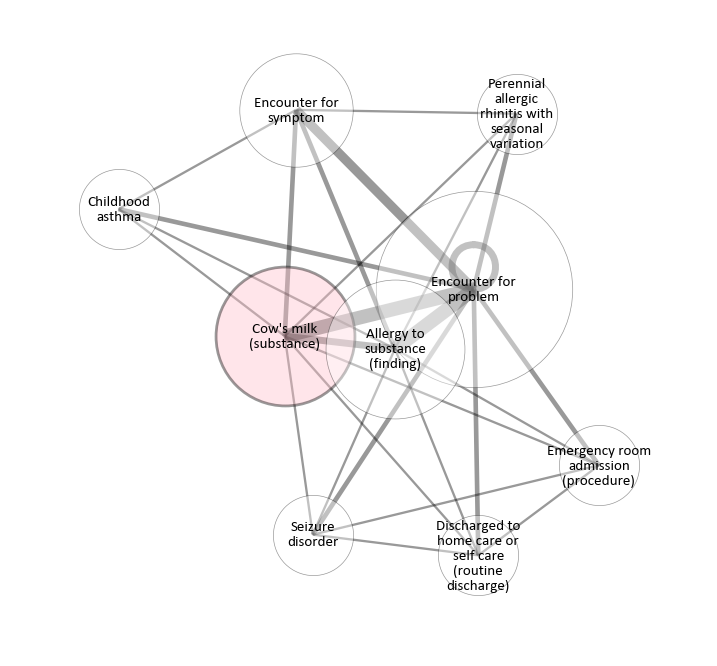

In [283]:
# Define a global variable to store the selected node
selected_node = []
PADDING = 0.1

def on_dropdown_select(event):
    global selected_groups, selected_nodes, selected_code, initial_num_nodes, selected_node
    selected_nodes = []
    selected_code = dropdown.get()  # Get the currently selected item from the dropdown menu
    selected_groups = [group for group in groups if selected_code in group]
    initial_num_nodes = len(set([item for sublist in selected_groups for item in sublist]))
    print(initial_num_nodes)  # Verify initial_num_nodes value

    selected_node = selected_code  # Store the selected node

    # Update slider range and tickinterval
    slider.config(from_=0, to=initial_num_nodes, tickinterval=max(1, initial_num_nodes))

    # Clear log text before inserting new content
    log_text.delete(1.0, tk.END)

    # Insert selected nodes and their translation
    if selected_nodes:
        log_text.insert(tk.END, "Visualized nodes and their translation:\n")
        for node in selected_nodes[::-1]:
            display_name = options_zip.get(node, "Unknown")
            log_text.insert(tk.END, "{}: {}\n".format(node, display_name))

    num_nodes_to_visualize = len(selected_nodes)
    generate_graph(canvas, selected_groups, num_nodes_to_visualize, log_text, selected_node)

    # Update the label with the display value of the selected node
    selected_display = options_zip.get(selected_code, "Unknown")
    display_label.config(text=" {}".format(selected_display))


def on_slider_move(value):
    global selected_groups, selected_nodes, selected_code, selected_node

    num_nodes_to_visualize = int(value)

    selected_groups = [group for group in groups if selected_code in group]

    # Flatten the selected groups and sort them by occurrence count
    all_selected_nodes = [node for group in selected_groups for node in group]
    node_counts = Counter(all_selected_nodes)
    sorted_nodes = sorted(node_counts, key=node_counts.get, reverse=True)

    # Select the nodes to visualize based on the slider value
    selected_nodes = sorted_nodes[:num_nodes_to_visualize]

    # Generate the graph with the selected nodes
    generate_graph(canvas, selected_groups, num_nodes_to_visualize, log_text, selected_node)


def generate_graph(canvas, selected_groups, num_nodes_to_visualize, log_text, selected_node):

    plt.clf()  # Clear current figure
    log_text.delete(1.0, tk.END)  # Clear previous logs
    

    labels = {}  

    G = nx.Graph()  # Initialize empty undirected graph
    
    # Add edges within selected groups
    for group in selected_groups:
        add_edges_within_group(G, group)
        
#     if log_text:
#         log_text.insert(tk.END, "Selected groups: {}\n".format(selected_groups))

    node_counts = Counter([node for group in selected_groups for node in group])

    sorted_nodes = sorted(node_counts, key=node_counts.get, reverse=True)
    
    selected_nodes = sorted_nodes[:num_nodes_to_visualize]
    
    subgraph = G.subgraph(selected_nodes)
    # Configure visual properties
    if len(subgraph) < 11:
        pos = nx.spring_layout(subgraph)
    else:
        pos = nx.circular_layout(subgraph)
    
    # Count occurrences of edges between nodes in selected groups
    edge_occurrences = Counter()
    edge_labels = {}
    for group in selected_groups:
        for i in range(len(group)):
            for j in range(i + 1, len(group)):
                node_pair = tuple(sorted([group[i], group[j]]))
                if node_pair not in edge_occurrences:
                    edge_occurrences[node_pair] = 0
                    edge_labels[node_pair] = f"{group[i]}-{group[j]}"
                edge_occurrences[node_pair] += 1
    
    # Calculate edge widths proportional to occurrences
    edge_widths = [edge_occurrences[tuple(sorted(edge))] for edge in subgraph.edges()]
    
    if log_text and selected_nodes:  # Check if selected_nodes is not empty
        log_text.insert(tk.END, "Visualized nodes and their translation:\n")
        for node in selected_nodes[::-1]:  # Print in reverse order
            display_name = options_zip.get(node, "Unknown")
            log_text.insert(tk.END, "{}: {}\n".format(node, display_name))
    # Print edge widths alongside corresponding node pairs
    for edge, width in zip(subgraph.edges(), edge_widths):
        node_pair = tuple(sorted(edge))
        if log_text:
            log_text.insert(tk.END, f"Edge {edge_labels[node_pair]}: {width}\n")
    
    if log_text:
        log_text.insert(tk.END, "Node occurrences: {}\n".format(node_counts))
      
   # Calculate normalization factors based on the number of nodes to visualize
    num_nodes_to_visualize = max(1, min(num_nodes_to_visualize, len(subgraph.nodes())))
    num_edges = len(subgraph.edges())
    
    if num_nodes_to_visualize > 0:
        # Calculate node size and edge width factors to fit within the desired range
        max_node_size = 20000
        min_node_size = 0
        max_edge_width = 10
        min_edge_width = 0
        
        # Calculate scaling factors if node_counts and edge_occurrences are not empty
        if node_counts:
            node_size_factor = (max_node_size - min_node_size) / max(node_counts.values())
        else:
            node_size_factor = 0
        
        if edge_occurrences:
            edge_width_factor = (max_edge_width - min_edge_width) / max(edge_occurrences.values())
        else:
            edge_width_factor = 0
    
    # Normalize node size and edge width
    node_size = [min(max(node_counts[n] * node_size_factor, min_node_size), max_node_size) for n in subgraph.nodes()]
    edge_widths = [min(max(edge_occurrences[tuple(sorted(edge))] * edge_width_factor, min_edge_width), max_edge_width) for edge in subgraph.edges()]

  
    selected_node_color = "pink"  # Choose a color for the selected node
    selected_node_linewidth = 2.0  # Choose a linewidth for the selected node

    for node in subgraph.nodes():
        if node == selected_node:  # Check if the current node is the selected node
            nx.draw_networkx_nodes(subgraph, pos, nodelist=[node], node_size=node_size_factor * node_counts[node],
                                   node_color=selected_node_color, edgecolors="k", alpha=0.4, linewidths=selected_node_linewidth)
        else:
            nx.draw_networkx_nodes(subgraph, pos, nodelist=[node], node_size=node_size_factor * node_counts[node],
                                   node_color="w", edgecolors="k", alpha=0.4, linewidths=0.5)

    if len(subgraph) > 1:
        nx.draw_networkx_edges(subgraph, pos, width=edge_widths, edge_color="black", alpha=0.4)
    
    # Draw labels on the nodes using plt.annotate
    for node, (x, y) in pos.items():
        text = labels.get(node, "")
        plt.annotate(text, (x, y), fontsize=30, ha='center', va='center')

    # Add padding to the boundaries of the figure
    xmin, xmax = plt.xlim()
    ymin, ymax = plt.ylim()
    xmargin = (xmax - xmin) * PADDING
    ymargin = (ymax - ymin) * PADDING
    plt.xlim(xmin - xmargin, xmax + xmargin)
    plt.ylim(ymin - ymargin, ymax + ymargin)
    
        # Create labels with display names and wrap text
    labels = {}
    for node in subgraph.nodes():
        if node in options_zip:
            label = options_zip[node]
            wrapped_label = '\n'.join(textwrap.wrap(label, width=15))  # Adjust width as needed
            labels[node] = wrapped_label
    
    # Draw labels on the nodes
    nx.draw_networkx_labels(subgraph, pos, labels=labels, font_size=12/math.log(num_nodes_to_visualize+1, 8),
                            font_family='Calibri', font_weight='normal')
    
     

    plt.axis("off")
    canvas.draw()


def add_edges_within_group(G, group):
    if isinstance(group, int):
        return
    for i, u in enumerate(group):
        for v in group[:i]:
            if isinstance(u, str) and isinstance(v, str):
                G.add_edge(u, v, weight=1)
            elif isinstance(u, tuple) and isinstance(v, tuple):
                for a in u:
                    for b in v:
                        G.add_edge(a, b, weight=1)

def on_arrow_key(event):
    global slider
    current_value = int(slider.get())
    if event.keysym == 'Right':
        slider.set(current_value + 1)
    elif event.keysym == 'Left':
        slider.set(current_value - 1)
        


# Create the main Tkinter window
root = tk.Tk()
root.title("Graph Visualization")

# Define the selected groups and dropdown menu
selected_groups = []
dropdown = ttk.Combobox(root, values=options)
dropdown.grid(row=0, column=0, padx=10, pady=10)
dropdown.bind("<<ComboboxSelected>>", on_dropdown_select)

# Define a label to display the value of the selected node
display_label = tk.Label(root, text="")
display_label.grid(row=0, column=1, padx=10, pady=10)

# Define the slider for selecting the number of nodes to visualize
initial_num_nodes = 0
slider = tk.Scale(root, from_=0, to=initial_num_nodes, orient=tk.HORIZONTAL, length=200, tickinterval=initial_num_nodes,
                  command=on_slider_move)  # Remove lambda and extra argument

slider.grid(row=0, column=2, padx=10, pady=10)


# Bind arrow keys to the function
root.bind('<Right>', on_arrow_key)
root.bind('<Left>', on_arrow_key)

# Create the figure and canvas for displaying the graph
fig = plt.figure(figsize=(9, 9))
canvas = FigureCanvasTkAgg(fig, master=root)
canvas.get_tk_widget().grid(row=1, column=0, padx=10, pady=10, columnspan=3)

# Create the log viewer Text widget
log_text = tk.Text(root, wrap=tk.WORD, width=40, height=20)
log_text.grid(row=1, column=3, padx=10, pady=10, sticky="nsew", columnspan=3)

# Configure grid weights to make the log viewer resizable
root.grid_rowconfigure(1, weight=1)
root.grid_columnconfigure(0, weight=1)
root.grid_columnconfigure(1, weight=1)
root.grid_columnconfigure(2, weight=1)

# Generate the initial graph with empty selected groups
generate_graph(canvas, [], 0, log_text, selected_node)

# Start the Tkinter event loop
root.mainloop()

## WRAP TEXT

In [276]:


def generate_graph(canvas, selected_groups, num_nodes_to_visualize, padding=0.1):
    plt.clf()  # Clear current figure
 
    G = nx.Graph()  # Initialize empty undirected graph
    
    # Add edges within selected groups
    for group in selected_groups:
        add_edges_within_group(G, group)
    
    # Count occurrences of each node in selected groups
    node_counts = Counter([node for group in selected_groups for node in group])
    
    sorted_nodes = sorted(node_counts, key=node_counts.get, reverse=True)
    
    selected_nodes = sorted_nodes[:num_nodes_to_visualize]
    subgraph = G.subgraph(selected_nodes)
    
    # Configure visual properties
    if len(subgraph) < 10:
        pos = nx.spring_layout(subgraph)
    else:
        pos = nx.circular_layout(subgraph)
    
    # Count occurrences of edges between nodes in selected groups
    edge_occurrences = Counter()
    edge_labels = {}
    for group in selected_groups:
        for i in range(len(group)):
            for j in range(i + 1, len(group)):
                node_pair = tuple(sorted([group[i], group[j]]))
                if node_pair not in edge_occurrences:
                    edge_occurrences[node_pair] = 0
                    edge_labels[node_pair] = f"{group[i]}-{group[j]}"
                edge_occurrences[node_pair] += 1
    
    # Calculate edge widths proportional to occurrences
    edge_widths = [edge_occurrences[tuple(sorted(edge))] for edge in subgraph.edges()]
    
    # Calculate normalization factors based on the number of nodes to visualize
    num_nodes_to_visualize = max(1, min(num_nodes_to_visualize, len(subgraph.nodes())))
    num_edges = len(subgraph.edges())
    
    if num_nodes_to_visualize > 0:
        node_size_factor = 5000 / num_nodes_to_visualize
    
    if num_edges > 0:
        edge_width_factor = 1 / num_edges
    
    # Normalize node size and edge width
    node_size = [node_counts[n] * node_size_factor for n in subgraph.nodes()]
    edge_widths = [edge_occurrences[tuple(sorted(edge))] * edge_width_factor for edge in subgraph.edges()]
    
    # Draw nodes and edges with normalized sizes
    nx.draw_networkx_nodes(subgraph, pos, node_size=node_size, node_color="w", edgecolors="k", linewidths=0.5)
    if len(subgraph) > 1:
        nx.draw_networkx_edges(subgraph, pos, width=edge_widths, edge_color="black", alpha=0.4)
    
    # Add padding to the boundaries of the figure
    xmin, xmax = plt.xlim()
    ymin, ymax = plt.ylim()
    xmargin = (xmax - xmin) * padding
    ymargin = (ymax - ymin) * padding
    plt.xlim(xmin - xmargin, xmax + xmargin)
    plt.ylim(ymin - ymargin, ymax + ymargin)
    
    # Create labels with display names and wrap text
    labels = {}
    for node in subgraph.nodes():
        if node in options_zip:
            label = options_zip[node]
            wrapped_label = '\n'.join(textwrap.wrap(label, width=10))  # Adjust width as needed
            labels[node] = wrapped_label
    
    # Draw labels on the nodes
    nx.draw_networkx_labels(subgraph, pos, labels=labels, font_size=20/math.log(num_nodes_to_visualize+1, 3),
                            font_family='Calibri', font_weight='normal')
    
    # Add tooltips to nodes
    cursor = mplcursors.cursor(hover=True)
    cursor.connect("add", lambda sel: sel.annotation.set_text(options_zip.get(sel.target, "")))
    
    # Add hover effect to nodes
    hover_font_size = 30
    for node, (x, y) in pos.items():
        text = labels.get(node, "")
        plt.text(x, y, text, fontsize=hover_font_size, ha='center', va='center', alpha=0.0)
        plt.text(x, y, text, fontsize=hover_font_size, ha='center', va='center', alpha=0.0, zorder=10)
    
    plt.axis("off")
    canvas.draw()



    
def on_dropdown_select(event):
    
    global selected_groups
    
    selected_code = dropdown.get()
    
    selected_groups = [group for group in groups if selected_code in group]
    print('selected_groups', selected_groups)
    
    num_nodes_to_visualize = len(set([item for sublist in selected_groups for item in sublist]))
    print('num_nodes_to_visualize', num_nodes_to_visualize)
    slider.config(from_=1, to=num_nodes_to_visualize, tickinterval=num_nodes_to_visualize-1)
    
    generate_graph(canvas, selected_groups, 1)

def add_edges_within_group(G, group):
    if isinstance(group, int):
        return
    for i, u in enumerate(group):
        for v in group[:i]:
            if isinstance(u, str) and isinstance(v, str):
                G.add_edge(u, v, weight=1)
            elif isinstance(u, tuple) and isinstance(v, tuple):
                for a in u:
                    for b in v:
                        G.add_edge(a, b, weight=1)

root = tk.Tk()
root.title("Graph Visualization")

selected_groups = []
dropdown = ttk.Combobox(root, values=options)
dropdown.grid(row=0, column=0, padx=10, pady=10)
dropdown.bind("<<ComboboxSelected>>", on_dropdown_select)

initial_num_nodes = 0
slider = tk.Scale(root, from_=0, to=initial_num_nodes, orient=tk.HORIZONTAL, length=200, tickinterval=initial_num_nodes,
                  command=lambda x: generate_graph(canvas, selected_groups, int(x)))
slider.grid(row=0, column=1, padx=10, pady=10)

fig = plt.figure(figsize=(9, 9))
canvas = FigureCanvasTkAgg(fig, master=root)
root.configure(bg='darkgrey')
canvas.get_tk_widget().grid(row=1, column=0, columnspan=2)

generate_graph(canvas, [], 0)

root.mainloop()


selected_groups [['185347001', '3718001', '185347001', '419199007', '185345009', '233678006'], ['185347001', '3718001', '185347001', '419199007', '185345009', '232353008'], ['185347001', '3718001', '185347001', '419199007', '50849002', '128613002', '01']]
num_nodes_to_visualize 9


Traceback (most recent call last):
  File "C:\ProgramData\anaconda3\Lib\site-packages\matplotlib\cbook\__init__.py", line 309, in process
    func(*args, **kwargs)
  File "C:\Users\begon\AppData\Roaming\Python\Python311\site-packages\mplcursors\_mplcursors.py", line 577, in _on_hover_motion_notify
    self._on_select_event(event)
  File "C:\Users\begon\AppData\Roaming\Python\Python311\site-packages\mplcursors\_mplcursors.py", line 625, in _on_select_event
    self.add_selection(pi)
  File "C:\Users\begon\AppData\Roaming\Python\Python311\site-packages\mplcursors\_mplcursors.py", line 408, in add_selection
    cb(sel)
  File "C:\Users\begon\AppData\Local\Temp\ipykernel_10876\3675261783.py", line 80, in <lambda>
    cursor.connect("add", lambda sel: sel.annotation.set_text(options_zip.get(sel.target, "")))
                                                              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
TypeError: unhashable type: '_Target'


Error in callback <function _draw_all_if_interactive at 0x0000029FB6A14900> (for post_execute):


StopIteration: 

StopIteration: 

<Figure size 900x900 with 1 Axes>

## DISPLAY

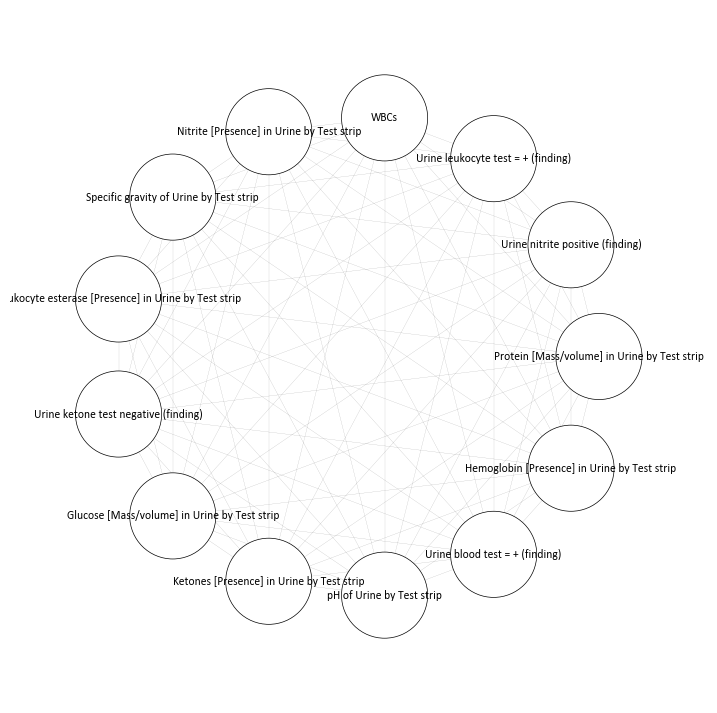

In [87]:


def generate_graph(canvas, selected_groups, num_nodes_to_visualize, padding=0.1):
    
    plt.clf()  # Clear current figure
    
    # Creates the related components and their connections that will be visualized
    G = nx.Graph()  # Initialize empty undirected graph
    
    for group in selected_groups:
        add_edges_within_group(G, group)  # Add edges within group
    
    # Count occurrences of each node in selected groups
    node_counts = Counter([node for group in selected_groups for node in group])
    
    sorted_nodes = sorted(node_counts, key=node_counts.get, reverse=True)
    
    selected_nodes = sorted_nodes[:num_nodes_to_visualize]  # Related to slider value
    
    subgraph = G.subgraph(selected_nodes)  # Only with selected nodes
    
    # Configure visual properties
    if len(subgraph) < 10:
        pos = nx.spring_layout(subgraph)
    else:
        pos = nx.circular_layout(subgraph)
        
    # Count occurrences of edges between nodes in selected groups
    edge_occurrences = Counter()
    edge_labels = {}  # Store labels for each edge

    for group in selected_groups:
        for i in range(len(group)):
            for j in range(i + 1, len(group)):
                node_pair = tuple(sorted([group[i], group[j]]))  # Ensure consistent order for node pair
                if node_pair not in edge_occurrences:
                    edge_occurrences[node_pair] = 0
                    edge_labels[node_pair] = f"{group[i]}-{group[j]}"  # Store label for this edge
                edge_occurrences[node_pair] += 1
    
    # Calculate edge widths proportional to occurrences
    edge_widths = [edge_occurrences[tuple(sorted(edge))] for edge in subgraph.edges()]
    
    # Calculate normalization factors based on the number of nodes to visualize
    num_nodes_to_visualize = max(1, min(num_nodes_to_visualize, len(subgraph.nodes())))
    num_edges = len(subgraph.edges())
    
    if num_nodes_to_visualize > 0:
        node_size_factor = 5000 / num_nodes_to_visualize
    else:
        pass
    
    if num_edges > 0:
        edge_width_factor = 1 / num_edges
    else:
        pass
    
    # Normalize node size and edge width
    node_size = [node_counts[n] * node_size_factor for n in subgraph.nodes()]
    edge_widths = [edge_occurrences[tuple(sorted(edge))] * edge_width_factor for edge in subgraph.edges()]
    
    # Draw nodes and edges with normalized sizes
    nx.draw_networkx_nodes(subgraph, pos, node_size=node_size, node_color="w", edgecolors="k", linewidths=0.5)
    if len(subgraph) > 1:
        nx.draw_networkx_edges(subgraph, pos, width=edge_widths, edge_color="black", alpha=0.4)
    
    # Add padding to the boundaries of the figure
    xmin, xmax = plt.xlim()
    ymin, ymax = plt.ylim()
    xmargin = (xmax - xmin) * padding
    ymargin = (ymax - ymin) * padding
    plt.xlim(xmin - xmargin, xmax + xmargin)
    plt.ylim(ymin - ymargin, ymax + ymargin)
    
    # Create labels with display names
    labels = {node: options_zip[node] for node in subgraph.nodes() if node in options_zip}
    
    # Draw labels on the nodes
    nx.draw_networkx_labels(subgraph, pos, labels=labels, font_size=20/math.log(num_nodes_to_visualize+1, 3), font_family='Calibri', font_weight='normal')
    
    # Add tooltips to nodes
    cursor = mplcursors.cursor(hover=True)
    cursor.connect("add", lambda sel: sel.annotation.set_text(options_zip.get(sel.target, "")))
    
    plt.axis("off")
    canvas.draw()
    
def on_dropdown_select(event):
    
    global selected_groups
    
    selected_code = dropdown.get()
    
    selected_groups = [group for group in groups if selected_code in group]
    print('selected_groups', selected_groups)
    
    num_nodes_to_visualize = len(set([item for sublist in selected_groups for item in sublist]))
    print('num_nodes_to_visualize', num_nodes_to_visualize)
    slider.config(from_=1, to=num_nodes_to_visualize, tickinterval=num_nodes_to_visualize-1)
    
    generate_graph(canvas, selected_groups, 1)

def add_edges_within_group(G, group):
    if isinstance(group, int):
        return
    for i, u in enumerate(group):
        for v in group[:i]:
            if isinstance(u, str) and isinstance(v, str):
                G.add_edge(u, v, weight=1)
            elif isinstance(u, tuple) and isinstance(v, tuple):
                for a in u:
                    for b in v:
                        G.add_edge(a, b, weight=1)

root = tk.Tk()
root.title("Graph Visualization")

selected_groups = []
dropdown = ttk.Combobox(root, values=options)
dropdown.grid(row=0, column=0, padx=10, pady=10)
dropdown.bind("<<ComboboxSelected>>", on_dropdown_select)

initial_num_nodes = 0
slider = tk.Scale(root, from_=0, to=initial_num_nodes, orient=tk.HORIZONTAL, length=200, tickinterval=initial_num_nodes,
                  command=lambda x: generate_graph(canvas, selected_groups, int(x)))
slider.grid(row=0, column=1, padx=10, pady=10)

fig = plt.figure(figsize=(9, 9))
canvas = FigureCanvasTkAgg(fig, master=root)
root.configure(bg='darkgrey')
canvas.get_tk_widget().grid(row=1, column=0, columnspan=2)

generate_graph(canvas, [], 0)

root.mainloop()


## CODES

node_occurrences Counter()
sorted_nodes []
selected_nodes []
selected_groups [['75636-1', '85354-9', '8462-4', '8480-6', '8867-4', '9279-1', '2708-6', '59408-5', '8310-5', '8331-1', '5792-7', '2514-8', '167287002', '5811-5', '5803-2', '5804-0', '5802-4', '314137006', '5794-3', '167300001', '5799-2', '394712000', '5821-4', '13945-1', '5787-7', '24124-0', '167336003', '8247-9', '276409005', '5769-5', '365691004', '630-4'], ['5792-7', '2514-8', '167287002', '5811-5', '5803-2', '5804-0', '5802-4', '314137006', '5794-3', '167300001', '5799-2', '394712000', '5821-4', '13945-1', '5787-7', '24124-0', '167336003', '8247-9', '276409005', '5769-5', '365691004', '630-4'], ['5792-7', '2514-8', '167287002', '5811-5', '5803-2', '5804-0', '5802-4', '314137006', '5794-3', '167300001', '5799-2', '394712000', '5821-4', '13945-1', '5787-7', '24124-0', '167336003', '8247-9', '276409005', '5769-5', '365691004', '630-4'], ['5792-7', '2514-8', '167287002', '5811-5', '5803-2', '5804-0', '5802-4', '314137006', 

node_occurrences Counter({'5792-7': 10, '2514-8': 10, '167287002': 10, '5811-5': 10, '5803-2': 10, '5804-0': 10, '5802-4': 10, '314137006': 10, '5794-3': 10, '167300001': 10, '5799-2': 10, '394712000': 10, '5821-4': 10, '13945-1': 10, '5787-7': 10, '24124-0': 10, '167336003': 10, '8247-9': 10, '276409005': 10, '5769-5': 10, '365691004': 10, '630-4': 10, '75636-1': 4, '85354-9': 4, '8462-4': 4, '8480-6': 4, '8867-4': 4, '9279-1': 4, '2708-6': 4, '59408-5': 4, '8310-5': 4, '8331-1': 4, '6690-2': 1, '789-8': 1, '718-7': 1, '4544-3': 1, '787-2': 1, '785-6': 1, '786-4': 1, '21000-5': 1, '777-3': 1, '32207-3': 1, '32623-1': 1, '2345-7': 1, '3094-0': 1, '2160-0': 1, '17861-6': 1, '2951-2': 1, '2823-3': 1, '2075-0': 1, '2028-9': 1, '33914-3': 1, '2106-3': 1, '260385009': 1})
sorted_nodes ['5792-7', '2514-8', '167287002', '5811-5', '5803-2', '5804-0', '5802-4', '314137006', '5794-3', '167300001', '5799-2', '394712000', '5821-4', '13945-1', '5787-7', '24124-0', '167336003', '8247-9', '276409005'

node_occurrences Counter({'5792-7': 10, '2514-8': 10, '167287002': 10, '5811-5': 10, '5803-2': 10, '5804-0': 10, '5802-4': 10, '314137006': 10, '5794-3': 10, '167300001': 10, '5799-2': 10, '394712000': 10, '5821-4': 10, '13945-1': 10, '5787-7': 10, '24124-0': 10, '167336003': 10, '8247-9': 10, '276409005': 10, '5769-5': 10, '365691004': 10, '630-4': 10, '75636-1': 4, '85354-9': 4, '8462-4': 4, '8480-6': 4, '8867-4': 4, '9279-1': 4, '2708-6': 4, '59408-5': 4, '8310-5': 4, '8331-1': 4, '6690-2': 1, '789-8': 1, '718-7': 1, '4544-3': 1, '787-2': 1, '785-6': 1, '786-4': 1, '21000-5': 1, '777-3': 1, '32207-3': 1, '32623-1': 1, '2345-7': 1, '3094-0': 1, '2160-0': 1, '17861-6': 1, '2951-2': 1, '2823-3': 1, '2075-0': 1, '2028-9': 1, '33914-3': 1, '2106-3': 1, '260385009': 1})
sorted_nodes ['5792-7', '2514-8', '167287002', '5811-5', '5803-2', '5804-0', '5802-4', '314137006', '5794-3', '167300001', '5799-2', '394712000', '5821-4', '13945-1', '5787-7', '24124-0', '167336003', '8247-9', '276409005'

node_occurrences Counter({'5792-7': 10, '2514-8': 10, '167287002': 10, '5811-5': 10, '5803-2': 10, '5804-0': 10, '5802-4': 10, '314137006': 10, '5794-3': 10, '167300001': 10, '5799-2': 10, '394712000': 10, '5821-4': 10, '13945-1': 10, '5787-7': 10, '24124-0': 10, '167336003': 10, '8247-9': 10, '276409005': 10, '5769-5': 10, '365691004': 10, '630-4': 10, '75636-1': 4, '85354-9': 4, '8462-4': 4, '8480-6': 4, '8867-4': 4, '9279-1': 4, '2708-6': 4, '59408-5': 4, '8310-5': 4, '8331-1': 4, '6690-2': 1, '789-8': 1, '718-7': 1, '4544-3': 1, '787-2': 1, '785-6': 1, '786-4': 1, '21000-5': 1, '777-3': 1, '32207-3': 1, '32623-1': 1, '2345-7': 1, '3094-0': 1, '2160-0': 1, '17861-6': 1, '2951-2': 1, '2823-3': 1, '2075-0': 1, '2028-9': 1, '33914-3': 1, '2106-3': 1, '260385009': 1})
sorted_nodes ['5792-7', '2514-8', '167287002', '5811-5', '5803-2', '5804-0', '5802-4', '314137006', '5794-3', '167300001', '5799-2', '394712000', '5821-4', '13945-1', '5787-7', '24124-0', '167336003', '8247-9', '276409005'

node_occurrences Counter({'5792-7': 10, '2514-8': 10, '167287002': 10, '5811-5': 10, '5803-2': 10, '5804-0': 10, '5802-4': 10, '314137006': 10, '5794-3': 10, '167300001': 10, '5799-2': 10, '394712000': 10, '5821-4': 10, '13945-1': 10, '5787-7': 10, '24124-0': 10, '167336003': 10, '8247-9': 10, '276409005': 10, '5769-5': 10, '365691004': 10, '630-4': 10, '75636-1': 4, '85354-9': 4, '8462-4': 4, '8480-6': 4, '8867-4': 4, '9279-1': 4, '2708-6': 4, '59408-5': 4, '8310-5': 4, '8331-1': 4, '6690-2': 1, '789-8': 1, '718-7': 1, '4544-3': 1, '787-2': 1, '785-6': 1, '786-4': 1, '21000-5': 1, '777-3': 1, '32207-3': 1, '32623-1': 1, '2345-7': 1, '3094-0': 1, '2160-0': 1, '17861-6': 1, '2951-2': 1, '2823-3': 1, '2075-0': 1, '2028-9': 1, '33914-3': 1, '2106-3': 1, '260385009': 1})
sorted_nodes ['5792-7', '2514-8', '167287002', '5811-5', '5803-2', '5804-0', '5802-4', '314137006', '5794-3', '167300001', '5799-2', '394712000', '5821-4', '13945-1', '5787-7', '24124-0', '167336003', '8247-9', '276409005'

node_occurrences Counter({'5792-7': 10, '2514-8': 10, '167287002': 10, '5811-5': 10, '5803-2': 10, '5804-0': 10, '5802-4': 10, '314137006': 10, '5794-3': 10, '167300001': 10, '5799-2': 10, '394712000': 10, '5821-4': 10, '13945-1': 10, '5787-7': 10, '24124-0': 10, '167336003': 10, '8247-9': 10, '276409005': 10, '5769-5': 10, '365691004': 10, '630-4': 10, '75636-1': 4, '85354-9': 4, '8462-4': 4, '8480-6': 4, '8867-4': 4, '9279-1': 4, '2708-6': 4, '59408-5': 4, '8310-5': 4, '8331-1': 4, '6690-2': 1, '789-8': 1, '718-7': 1, '4544-3': 1, '787-2': 1, '785-6': 1, '786-4': 1, '21000-5': 1, '777-3': 1, '32207-3': 1, '32623-1': 1, '2345-7': 1, '3094-0': 1, '2160-0': 1, '17861-6': 1, '2951-2': 1, '2823-3': 1, '2075-0': 1, '2028-9': 1, '33914-3': 1, '2106-3': 1, '260385009': 1})
sorted_nodes ['5792-7', '2514-8', '167287002', '5811-5', '5803-2', '5804-0', '5802-4', '314137006', '5794-3', '167300001', '5799-2', '394712000', '5821-4', '13945-1', '5787-7', '24124-0', '167336003', '8247-9', '276409005'

node_occurrences Counter({'5792-7': 10, '2514-8': 10, '167287002': 10, '5811-5': 10, '5803-2': 10, '5804-0': 10, '5802-4': 10, '314137006': 10, '5794-3': 10, '167300001': 10, '5799-2': 10, '394712000': 10, '5821-4': 10, '13945-1': 10, '5787-7': 10, '24124-0': 10, '167336003': 10, '8247-9': 10, '276409005': 10, '5769-5': 10, '365691004': 10, '630-4': 10, '75636-1': 4, '85354-9': 4, '8462-4': 4, '8480-6': 4, '8867-4': 4, '9279-1': 4, '2708-6': 4, '59408-5': 4, '8310-5': 4, '8331-1': 4, '6690-2': 1, '789-8': 1, '718-7': 1, '4544-3': 1, '787-2': 1, '785-6': 1, '786-4': 1, '21000-5': 1, '777-3': 1, '32207-3': 1, '32623-1': 1, '2345-7': 1, '3094-0': 1, '2160-0': 1, '17861-6': 1, '2951-2': 1, '2823-3': 1, '2075-0': 1, '2028-9': 1, '33914-3': 1, '2106-3': 1, '260385009': 1})
sorted_nodes ['5792-7', '2514-8', '167287002', '5811-5', '5803-2', '5804-0', '5802-4', '314137006', '5794-3', '167300001', '5799-2', '394712000', '5821-4', '13945-1', '5787-7', '24124-0', '167336003', '8247-9', '276409005'

node_occurrences Counter({'5792-7': 10, '2514-8': 10, '167287002': 10, '5811-5': 10, '5803-2': 10, '5804-0': 10, '5802-4': 10, '314137006': 10, '5794-3': 10, '167300001': 10, '5799-2': 10, '394712000': 10, '5821-4': 10, '13945-1': 10, '5787-7': 10, '24124-0': 10, '167336003': 10, '8247-9': 10, '276409005': 10, '5769-5': 10, '365691004': 10, '630-4': 10, '75636-1': 4, '85354-9': 4, '8462-4': 4, '8480-6': 4, '8867-4': 4, '9279-1': 4, '2708-6': 4, '59408-5': 4, '8310-5': 4, '8331-1': 4, '6690-2': 1, '789-8': 1, '718-7': 1, '4544-3': 1, '787-2': 1, '785-6': 1, '786-4': 1, '21000-5': 1, '777-3': 1, '32207-3': 1, '32623-1': 1, '2345-7': 1, '3094-0': 1, '2160-0': 1, '17861-6': 1, '2951-2': 1, '2823-3': 1, '2075-0': 1, '2028-9': 1, '33914-3': 1, '2106-3': 1, '260385009': 1})
sorted_nodes ['5792-7', '2514-8', '167287002', '5811-5', '5803-2', '5804-0', '5802-4', '314137006', '5794-3', '167300001', '5799-2', '394712000', '5821-4', '13945-1', '5787-7', '24124-0', '167336003', '8247-9', '276409005'

node_occurrences Counter({'5792-7': 10, '2514-8': 10, '167287002': 10, '5811-5': 10, '5803-2': 10, '5804-0': 10, '5802-4': 10, '314137006': 10, '5794-3': 10, '167300001': 10, '5799-2': 10, '394712000': 10, '5821-4': 10, '13945-1': 10, '5787-7': 10, '24124-0': 10, '167336003': 10, '8247-9': 10, '276409005': 10, '5769-5': 10, '365691004': 10, '630-4': 10, '75636-1': 4, '85354-9': 4, '8462-4': 4, '8480-6': 4, '8867-4': 4, '9279-1': 4, '2708-6': 4, '59408-5': 4, '8310-5': 4, '8331-1': 4, '6690-2': 1, '789-8': 1, '718-7': 1, '4544-3': 1, '787-2': 1, '785-6': 1, '786-4': 1, '21000-5': 1, '777-3': 1, '32207-3': 1, '32623-1': 1, '2345-7': 1, '3094-0': 1, '2160-0': 1, '17861-6': 1, '2951-2': 1, '2823-3': 1, '2075-0': 1, '2028-9': 1, '33914-3': 1, '2106-3': 1, '260385009': 1})
sorted_nodes ['5792-7', '2514-8', '167287002', '5811-5', '5803-2', '5804-0', '5802-4', '314137006', '5794-3', '167300001', '5799-2', '394712000', '5821-4', '13945-1', '5787-7', '24124-0', '167336003', '8247-9', '276409005'

node_occurrences Counter({'5792-7': 10, '2514-8': 10, '167287002': 10, '5811-5': 10, '5803-2': 10, '5804-0': 10, '5802-4': 10, '314137006': 10, '5794-3': 10, '167300001': 10, '5799-2': 10, '394712000': 10, '5821-4': 10, '13945-1': 10, '5787-7': 10, '24124-0': 10, '167336003': 10, '8247-9': 10, '276409005': 10, '5769-5': 10, '365691004': 10, '630-4': 10, '75636-1': 4, '85354-9': 4, '8462-4': 4, '8480-6': 4, '8867-4': 4, '9279-1': 4, '2708-6': 4, '59408-5': 4, '8310-5': 4, '8331-1': 4, '6690-2': 1, '789-8': 1, '718-7': 1, '4544-3': 1, '787-2': 1, '785-6': 1, '786-4': 1, '21000-5': 1, '777-3': 1, '32207-3': 1, '32623-1': 1, '2345-7': 1, '3094-0': 1, '2160-0': 1, '17861-6': 1, '2951-2': 1, '2823-3': 1, '2075-0': 1, '2028-9': 1, '33914-3': 1, '2106-3': 1, '260385009': 1})
sorted_nodes ['5792-7', '2514-8', '167287002', '5811-5', '5803-2', '5804-0', '5802-4', '314137006', '5794-3', '167300001', '5799-2', '394712000', '5821-4', '13945-1', '5787-7', '24124-0', '167336003', '8247-9', '276409005'

node_occurrences Counter({'5792-7': 10, '2514-8': 10, '167287002': 10, '5811-5': 10, '5803-2': 10, '5804-0': 10, '5802-4': 10, '314137006': 10, '5794-3': 10, '167300001': 10, '5799-2': 10, '394712000': 10, '5821-4': 10, '13945-1': 10, '5787-7': 10, '24124-0': 10, '167336003': 10, '8247-9': 10, '276409005': 10, '5769-5': 10, '365691004': 10, '630-4': 10, '75636-1': 4, '85354-9': 4, '8462-4': 4, '8480-6': 4, '8867-4': 4, '9279-1': 4, '2708-6': 4, '59408-5': 4, '8310-5': 4, '8331-1': 4, '6690-2': 1, '789-8': 1, '718-7': 1, '4544-3': 1, '787-2': 1, '785-6': 1, '786-4': 1, '21000-5': 1, '777-3': 1, '32207-3': 1, '32623-1': 1, '2345-7': 1, '3094-0': 1, '2160-0': 1, '17861-6': 1, '2951-2': 1, '2823-3': 1, '2075-0': 1, '2028-9': 1, '33914-3': 1, '2106-3': 1, '260385009': 1})
sorted_nodes ['5792-7', '2514-8', '167287002', '5811-5', '5803-2', '5804-0', '5802-4', '314137006', '5794-3', '167300001', '5799-2', '394712000', '5821-4', '13945-1', '5787-7', '24124-0', '167336003', '8247-9', '276409005'

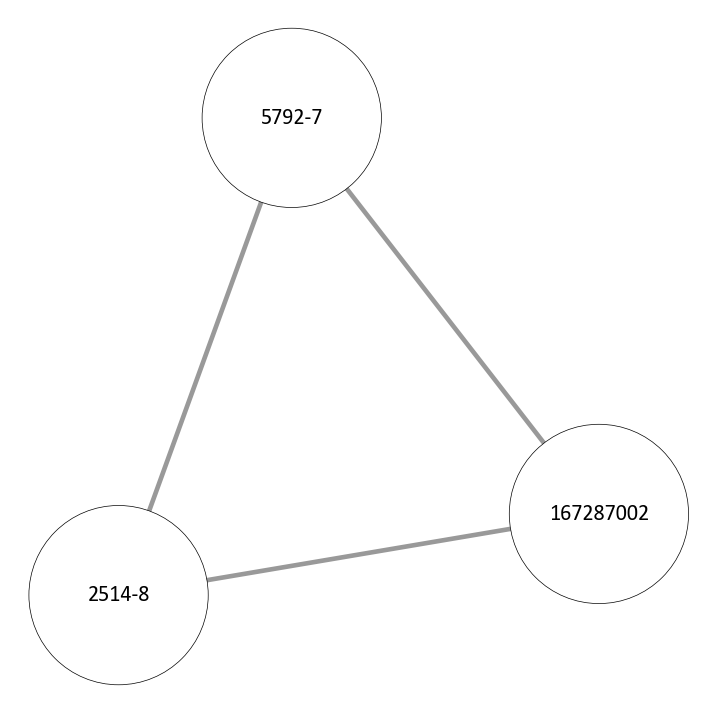

In [63]:


def generate_graph(canvas, selected_groups, num_nodes_to_visualize,padding=0.1):
    
    plt.clf() #clear current figure
    
    
    ### Creates the related components and their connections that will be visualized
    G = nx.Graph() # initialize empty indirected graph
    
    for group in selected_groups:
        add_edges_within_group(G, group)  # Add edges within group
    

    # Count occurrences of each node in selected groups
    node_counts = Counter([node for group in selected_groups for node in group])
    print('node_occurrences', node_counts)
        
   
    sorted_nodes = sorted(node_counts, key=node_counts.get, reverse=True)
    print('sorted_nodes',sorted_nodes)
    
    selected_nodes = sorted_nodes[:num_nodes_to_visualize] # related to slider value
    print('selected_nodes',selected_nodes)
    
    subgraph = G.subgraph(selected_nodes)  # only with selected nodes

    
    
    ### Configure visual properties
    if len(subgraph) < 10:
        pos = nx.spring_layout(subgraph)
    else:
        pos = nx.circular_layout(subgraph)
        

    # Count occurrences of edges between nodes in selected groups
    edge_occurrences = Counter()
    edge_labels = {}  # Store labels for each edge

    for group in selected_groups:
        for i in range(len(group)):
            for j in range(i + 1, len(group)):
                node_pair = tuple(sorted([group[i], group[j]]))  # Ensure consistent order for node pair
                if node_pair not in edge_occurrences:
                    edge_occurrences[node_pair] = 0
                    edge_labels[node_pair] = f"{group[i]}-{group[j]}"  # Store label for this edge
                edge_occurrences[node_pair] += 1

    # Calculate edge widths proportional to occurrences
    edge_widths = [edge_occurrences[tuple(sorted(edge))] for edge in subgraph.edges()]

    # Print edge widths alongside corresponding node pairs
    for edge, width in zip(subgraph.edges(), edge_widths):
        node_pair = tuple(sorted(edge))
        print(f"Edge {edge_labels[node_pair]}: {width}")

    
    # Calculate normalization factors based on the number of nodes to visualize
    num_nodes_to_visualize = max(1, min(num_nodes_to_visualize, len(subgraph.nodes())))
    num_edges = len(subgraph.edges())

    if num_nodes_to_visualize > 0:
        node_size_factor = 5000 / num_nodes_to_visualize
    else:
        pass #node_size_factor = 1  # Set a default value to avoid division by zero

    if num_edges > 0:
        edge_width_factor = 1 / num_edges
    else:
        pass #edge_width_factor = 1  # Set a default value to avoid division by zero


    # Normalize node size and edge width
    node_size = [node_counts[n] * node_size_factor for n in subgraph.nodes()]
    edge_widths = [edge_occurrences[tuple(sorted(edge))] * edge_width_factor for edge in subgraph.edges()]

    # Draw nodes and edges with normalized sizes
    nx.draw_networkx_nodes(subgraph, pos, node_size=node_size, node_color="w", edgecolors="k", linewidths=0.5)
    if len(subgraph) > 1:
        nx.draw_networkx_edges(subgraph, pos, width=edge_widths, edge_color="black", alpha=0.4)
    
        # Add padding to the boundaries of the figure
    xmin, xmax = plt.xlim()
    ymin, ymax = plt.ylim()
    xmargin = (xmax - xmin) * padding
    ymargin = (ymax - ymin) * padding
    plt.xlim(xmin - xmargin, xmax + xmargin)
    plt.ylim(ymin - ymargin, ymax + ymargin)
    
    nx.draw_networkx_labels(subgraph, pos, labels={node: str(node) for node in subgraph.nodes()}, font_size=20/math.log(num_nodes_to_visualize+1,3), font_family='Calibri', font_weight='normal')

    plt.axis("off")
    canvas.draw()
    


def on_dropdown_select(event):
    
    global selected_groups
    
    selected_code = dropdown.get()
    
    selected_groups = [group for group in groups if selected_code in group]
    print('selected_groups', selected_groups)
    
    num_nodes_to_visualize = len(set([item for sublist in selected_groups for item in sublist]))
    print('num_nodes_to_visualize', num_nodes_to_visualize)
    slider.config(from_=1, to=num_nodes_to_visualize, tickinterval=num_nodes_to_visualize-1)
    
    generate_graph(canvas, selected_groups, 1)



def add_edges_within_group(G, group):
    if isinstance(group, int):
        return
    for i, u in enumerate(group):
        for v in group[:i]:
            if isinstance(u, str) and isinstance(v, str):
                G.add_edge(u, v, weight=1)
            elif isinstance(u, tuple) and isinstance(v, tuple):
                for a in u:
                    for b in v:
                        G.add_edge(a, b, weight=1)

root = tk.Tk()
root.title("Graph Visualization")

selected_groups = []
dropdown = ttk.Combobox(root, values=options)
dropdown.grid(row=0, column=0, padx=10, pady=10)
dropdown.bind("<<ComboboxSelected>>", on_dropdown_select)

initial_num_nodes = 0
slider = tk.Scale(root, from_=0, to=initial_num_nodes, orient=tk.HORIZONTAL, length=200, tickinterval=initial_num_nodes,
                  command=lambda x: generate_graph(canvas, selected_groups, int(x)))
slider.grid(row=0, column=1, padx=10, pady=10)


fig = plt.figure(figsize=(9, 9))
#fig.set_facecolor((0.2, 0.2, 0.2))  # RGB values for a darker grey
canvas = FigureCanvasTkAgg(fig, master=root)
#root.attributes('-alpha', 0.8)  # Adjust alpha value as needed (0.0 to 1.0)
root.configure(bg='darkgrey')
canvas.get_tk_widget().grid(row=1, column=0, columnspan=2)

generate_graph(canvas, [], 0)

root.mainloop()



In [ ]:
import networkx as nx

# Create a graph
G = nx.Graph()

# Add some nodes
G.add_nodes_from([1, 2, 3, 4])

# Add some edges
G.add_edges_from([(1, 2), (1, 3), (2, 3), (3, 4)])

# Create a subgraph
subgraph = G.subgraph([1, 2, 3])

# Get the degree of node 1 in the subgraph
degree_of_node_1 = subgraph.degree(1)

print("Degree of node 1 in the subgraph:", degree_of_node_1)


In [ ]:
import matplotlib.pyplot as plt
import networkx as nx

# Create a graph
G = nx.Graph()

# Add some nodes
G.add_nodes_from([1, 2, 3, 4])

# Add some edges
G.add_edges_from([(1, 2), (1, 3), (2, 3), (3, 4)])

# Create a subgraph
subgraph = G.subgraph([1, 2, 3,4])

# Plot the subgraph
nx.draw(subgraph, with_labels=True, node_color='skyblue', node_size=500, font_size=12, font_color='black')
plt.show()


In [ ]:
subgraph.degree(4)

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
from mpl_toolkits.mplot3d import Axes3D

# Define a function to plot glanzing steel edges with a 3D effect
def plot_glanzing_steel_edges(ax, G, pos, depth=0.1):
    edges = []
    for edge in G.edges():
        x = [pos[edge[0]][0], pos[edge[1]][0]]
        y = [pos[edge[0]][1], pos[edge[1]][1]]
        z = [depth, depth]
        edges.append(list(zip(x, y, z)))
    for edge in edges:
        ax.plot(*edge, color='silver', linewidth=2)

# Create a graph
G = nx.Graph()

# Add nodes
G.add_nodes_from([1, 2, 3, 4, 5, 6])

# Add edges
G.add_edges_from([(1, 2), (1, 3), (2, 3), (3, 4), (4, 5), (4, 6), (5, 6)])

# Specify node positions in 2D space
pos = {1: (1, 1), 2: (2, 2), 3: (3, 3), 4: (4, 4), 5: (5, 5), 6: (6, 6)}

# Draw the graph
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Call function to plot glanzing steel edges with a 3D effect
plot_glanzing_steel_edges(ax, G, pos)

# Set axis labels
ax.set_xlabel('X', fontsize=12)
ax.set_ylabel('Y', fontsize=12)
ax.set_zlabel('Depth', fontsize=12)

# Set title
plt.title('Glanzing Steel Edges', fontsize=14)

# Show the graph
plt.show()


In [ ]:
    
def update_dropdown_list():
    global codes, displays
    
    selected_code = code_var.get()
    selected_display = display_var.get()
    
    if selected_code and selected_display:
        dropdown['values'] = [f"{code} ({display})" for code, display in zip(codes, displays)]
    elif selected_code:
        dropdown['values'] = codes
    elif selected_display:
        dropdown['values'] = displays
    else:
        dropdown['values'] = []

def on_dropdown_select(event):
    global selected_groups
    
    selected_item = dropdown.get()
    
    if code_var.get() and display_var.get():
        selected_item = selected_item.split(" (")[0]
    
    selected_groups = [group for group in groups if selected_item in group]
    print('selected_groups', selected_groups)
    
    num_nodes_to_visualize = len(set([item for sublist in selected_groups for item in sublist]))
    print('num_nodes_to_visualize', num_nodes_to_visualize)
    slider.config(from_=1, to=num_nodes_to_visualize, tickinterval=num_nodes_to_visualize-1)
    
    # Determine whether to use display names
    use_display = display_var.get()
    
    generate_graph(canvas, selected_groups, 1, use_display)


def add_edges_within_group(G, group):
    if isinstance(group, int):
        return
    for i, u in enumerate(group):
        for v in group[:i]:
            if isinstance(u, str) and isinstance(v, str):
                G.add_edge(u, v, weight=1)
            elif isinstance(u, tuple) and isinstance(v, tuple):
                for a in u:
                    for b in v:
                        G.add_edge(a, b, weight=1)

def generate_graph(canvas, selected_groups, num_nodes_to_visualize, use_display=False, padding=0.1):
    plt.clf()  # Clear current figure

    # Creates the related components and their connections that will be visualized
    G = nx.Graph()  # Initialize empty undirected graph
    
    for group in selected_groups:
        add_edges_within_group(G, group)  # Add edges within group

    # Count occurrences of each node in selected groups
    node_counts = Counter([node for group in selected_groups for node in group])

    sorted_nodes = sorted(node_counts, key=node_counts.get, reverse=True)

    selected_nodes = sorted_nodes[:num_nodes_to_visualize]  # Related to slider value

    subgraph = G.subgraph(selected_nodes)  # Only with selected nodes

    # Configure visual properties
    if len(subgraph) < 10:
        pos = nx.spring_layout(subgraph)
    else:
        pos = nx.circular_layout(subgraph)

    # Count occurrences of edges between nodes in selected groups
    edge_occurrences = Counter()
    edge_labels = {}  # Store labels for each edge

    for group in selected_groups:
        for i in range(len(group)):
            for j in range(i + 1, len(group)):
                node_pair = tuple(sorted([group[i], group[j]]))  # Ensure consistent order for node pair
                if node_pair not in edge_occurrences:
                    edge_occurrences[node_pair] = 0
                    edge_labels[node_pair] = f"{group[i]}-{group[j]}"  # Store label for this edge
                edge_occurrences[node_pair] += 1

    # Calculate edge widths proportional to occurrences
    edge_widths = [edge_occurrences[tuple(sorted(edge))] for edge in subgraph.edges()]

    # Calculate normalization factors based on the number of nodes to visualize
    num_nodes_to_visualize = max(1, min(num_nodes_to_visualize, len(subgraph.nodes())))
    num_edges = len(subgraph.edges())

    if num_nodes_to_visualize > 0:
        node_size_factor = 500 / num_nodes_to_visualize
    else:
        pass #node_size_factor = 1  # Set a default value to avoid division by zero

    if num_edges > 0:
        edge_width_factor = 1 / num_edges
    else:
        pass #edge_width_factor = 1  # Set a default value to avoid division by zero


    # Normalize node size and edge width
    node_size = [node_counts[n] * node_size_factor for n in subgraph.nodes()]
    edge_widths = [edge_occurrences[tuple(sorted(edge))] * edge_width_factor for edge in subgraph.edges()]

    # Draw nodes and edges with normalized sizes
    nx.draw_networkx_nodes(subgraph, pos, node_size=node_size, node_color="w", edgecolors="k", linewidths=0.5)
    if len(subgraph) > 1:
        nx.draw_networkx_edges(subgraph, pos, width=edge_widths, edge_color="black", alpha=0.4)
    
    # Change labels to display values if use_display is True
    labels = {node: str(node) for node in subgraph.nodes()}
    if use_display:
        for node in labels:
            if node in display_mapping:
                labels[node] = display_mapping[node]
    
    nx.draw_networkx_labels(subgraph, pos, labels=labels, font_size=50/math.log(num_nodes_to_visualize+1,3), font_family='Calibri', font_weight='normal')

    # Add padding to the boundaries of the figure
    xmin, xmax = plt.xlim()
    ymin, ymax = plt.ylim()
    xmargin = (xmax - xmin) * padding
    ymargin = (ymax - ymin) * padding
    plt.xlim(xmin - xmargin, xmax + xmargin)
    plt.ylim(ymin - ymargin, ymax + ymargin)

    plt.axis("off")
    canvas.draw()
    
    

def on_display_checkbox_click():
    global display_var, selected_groups
    use_display = display_var.get()
    generate_graph(canvas, selected_groups, 1, use_display)


    
    
root = tk.Tk()
root.title("FHIR")

# Checkbox variables
code_var = tk.BooleanVar()
display_var = tk.BooleanVar()

# Checkboxes
code_checkbox = tk.Checkbutton(root, text="Code", variable=code_var, command=update_dropdown_list)
code_checkbox.grid(row=0, column=0, padx=10, pady=10)

display_checkbox = tk.Checkbutton(root, text="Display", variable=display_var, command=update_dropdown_list)
display_checkbox.grid(row=0, column=1, padx=10, pady=10)

# Update the checkbox command
display_checkbox = tk.Checkbutton(root, text="Display", variable=display_var, command=on_display_checkbox_click)

# Dropdown list
dropdown = ttk.Combobox(root)
dropdown.grid(row=1, column=0, columnspan=2, padx=10, pady=10)
dropdown.bind("<<ComboboxSelected>>", on_dropdown_select)

# Slider
initial_num_nodes = 0
slider = tk.Scale(root, from_=0, to=initial_num_nodes, orient=tk.HORIZONTAL, length=200, tickinterval=initial_num_nodes,
                  command=lambda x: generate_graph(canvas, selected_groups, int(x)))
slider.grid(row=2, column=0, columnspan=2, padx=10, pady=10)

# Figure canvas
fig = plt.figure(figsize=(9, 9))
canvas = FigureCanvasTkAgg(fig, master=root)
canvas.get_tk_widget().grid(row=3, column=0, columnspan=2, padx=10, pady=10)

# Initialize selected groups
selected_groups = []

# Generate initial graph
generate_graph(canvas, [], 0)

# Start GUI main loop
root.mainloop()
